## Training custom object detection model in Azure with Tensorflow object detection library



Reference: https://github.com/tensorflow/models/tree/master/research/object_detection
Prerequisite: Please follow this guideline to install tensorflow object detection at a GPU DSVM
https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/installation.md

Overview of the steps:
- Convert data into tf records format
- Select and download a pre-trained model 
- Configure training pipeline
- Training 
- Export trained model as frozen graph
- Test model on validation data

In [1]:
#Import neccessary libararies 

import hashlib

import io

import json

import os

import contextlib2

import numpy as np

import PIL.Image

import sys

from pycocotools import mask

import tensorflow as tf

sys.path.append("../../models/research/")


from matplotlib import pyplot as plt
from PIL import Image
from object_detection.dataset_tools import tf_record_creation_util

from object_detection.utils import dataset_util

from object_detection.utils import label_map_util



/anaconda/envs/py35/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
#mount shared azure file to local computer. This libarary contain trained data

!sudo mount -t cifs //storagemsv2.file.core.windows.net/dampers-images ~/f_mount -o vers=3.0,username=storagemsv2,password=jVDLXC52nEdxNpEOOPHuTut75cI+FqxAWWITolFos62/aDz1XsVTCsJ+Qy6NEL9ZeLgOBDJth2INwyMCsS0Jtw==,dir_mode=0777,file_mode=0777,sec=ntlmssp


In [ ]:
#Assumption is images and annotation files are in the same folder, have the same name (just different extension)
#the procedure will read every image and annotation file and convert into tf record format for training with tensorflow 
#object detection API
from scipy import misc
import os
import glob
from lxml import etree
import numpy as np

import hashlib
import io
import logging
import os
import random
import re

import contextlib2
from lxml import etree
import numpy as np
import PIL.Image
import tensorflow as tf
import sys
sys.path.append("../../models/research/")



from object_detection.dataset_tools import tf_record_creation_util

from object_detection.utils import dataset_util

from object_detection.utils import label_map_util


def extract_annotation(input_dir):
#     category_index={}
    image_file_list = []
    bbox_list =[]
    labels =[]
    image_size_list =[]
    for annotation_file in glob.glob(input_dir+"/*.xml"):
#         print(annotation_file)
        #get all the jpg files
        image_file =annotation_file[:-3]+"jpg"
        e = etree.parse(annotation_file)
        root = e.getroot()
        obj_xml = root.findall('object')
        width, height = int(root.find('size').find("width").text), int(root.find('size').find("height").text)
        image_file_list.append(root.find('filename').text)
        image_label_list =[]
        image_size_list.append((width, height))
        image_bbox_list=[]
        for obj in obj_xml:
            bbox = obj.find('bndbox')
            image_label_list.append(obj.find("name").text.encode('utf8'))

            image_bbox_list.append({"xmin":float(bbox.find('xmin').text),
                           "ymin":float(bbox.find('ymin').text),
                           "xmax":float(bbox.find('xmax').text),
                           "ymax":float(bbox.find('ymax').text)})
        
        bbox_list.append(image_bbox_list)
        labels.append(image_label_list)

    return  image_file_list, bbox_list, labels, image_size_list

def create_example(image_dir,image_file, image_size, image_bbox_list,classes_text, class_ids):
    full_path = os.path.join(image_dir, image_file)
    with tf.gfile.GFile(full_path, 'rb') as fid:
        encoded_jpg = fid.read()
        key = hashlib.sha256(encoded_jpg).hexdigest()
    image_width = image_size[0]
    image_height = image_size[1]
    xmins = [bbox['xmin']/image_width for bbox in image_bbox_list]
    xmaxs = [bbox['xmax']/image_width for bbox in image_bbox_list]
    ymins = [bbox['ymin']/image_height for bbox in image_bbox_list]
    ymaxs = [bbox['ymax']/image_height for bbox in image_bbox_list]
    truncated = [0]
    poses = []
    difficult_obj = [0]
    feature_dict = {
    'image/height':
      dataset_util.int64_feature(image_height),
    'image/width':
      dataset_util.int64_feature(image_width),
    'image/key/sha256':
      dataset_util.bytes_feature(key.encode('utf8')),
    'image/encoded':
      dataset_util.bytes_feature(encoded_jpg),
    'image/format':
      dataset_util.bytes_feature(b'jpg'),
    'image/object/bbox/xmin':
      dataset_util.float_list_feature(xmins),
    'image/object/bbox/xmax':
      dataset_util.float_list_feature(xmaxs),
    'image/object/bbox/ymin':
      dataset_util.float_list_feature(ymins),
    'image/object/bbox/ymax':
      dataset_util.float_list_feature(ymaxs),
    'image/object/class/text': 
        dataset_util.bytes_list_feature(classes_text),
    'image/object/class/label':
      dataset_util.int64_list_feature(class_ids),

#     'image/object/view': dataset_util.bytes_list_feature(poses),

    }
    example = tf.train.Example(features=tf.train.Features(feature=feature_dict))

    return example
#Now the main part to execute TF Records creation
#Run params 
input_dir="/home/james/f_mount/dampers/val_multi_classes"
output_filename = 'data/val/tf_records_dumpers'
num_shards =5


image_file_list, bbox_list, labels, image_size_list= extract_annotation(input_dir)
full_label_list = [inner_label for label in labels for inner_label in label ]
unique_labels = np.unique(np.array(full_label_list)).tolist()
print(unique_labels)
num_cat = len(unique_labels)+1
category_index = {i:{i:unique_labels[i-1]} for i in range(1,num_cat)}
category_map = {unique_labels[i-1]:i for i in range(1,num_cat)}

with contextlib2.ExitStack() as tf_record_close_stack:
    output_tfrecords = tf_record_creation_util.open_sharded_output_tfrecords(
    tf_record_close_stack, output_filename, num_shards)
    for idx, (image_file, image_bbox, image_labels,image_size) in enumerate(zip(image_file_list, bbox_list, labels, image_size_list)):
#         image_path = os.path.join(input_dir, image_file)
#         with tf.gfile.GFile(image_path, 'r') as fid:
#             encoded_jpg = fid.read()
        class_ids = [category_map[class_name] for class_name in image_labels]
        tf_example = create_example(input_dir,image_file, image_size, image_bbox, image_labels,class_ids)
        shard_idx = idx % num_shards
        output_tfrecords[shard_idx].write(tf_example.SerializeToString())

        
        

In [40]:
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_coco_2018_01_28.tar.gz -P data


--2018-09-09 04:59:06--  http://download.tensorflow.org/models/object_detection/faster_rcnn_resnet101_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 216.58.216.176, 2607:f8b0:400a:807::2010
Connecting to download.tensorflow.org (download.tensorflow.org)|216.58.216.176|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 593445323 (566M) [application/x-tar]
Saving to: ‘data/faster_rcnn_resnet101_coco_2018_01_28.tar.gz’

faster_rcnn_resnet1 100%[===================>] 565.95M   153MB/s    in 3.8s    

2018-09-09 04:59:10 (151 MB/s) - ‘data/faster_rcnn_resnet101_coco_2018_01_28.tar.gz’ saved [593445323/593445323]



In [41]:
!tar -xvf data/faster_rcnn_resnet101_coco_2018_01_28.tar.gz

faster_rcnn_resnet101_coco_2018_01_28/
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.index
faster_rcnn_resnet101_coco_2018_01_28/checkpoint
faster_rcnn_resnet101_coco_2018_01_28/pipeline.config
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.meta
faster_rcnn_resnet101_coco_2018_01_28/saved_model/
faster_rcnn_resnet101_coco_2018_01_28/saved_model/saved_model.pb
faster_rcnn_resnet101_coco_2018_01_28/saved_model/variables/
faster_rcnn_resnet101_coco_2018_01_28/frozen_inference_graph.pb


In [56]:
!mkdir data/model_dir
!cp faster_rcnn_resnet101_coco_2018_01_28/model.ckpt.* data/model_dir

In [9]:
%%writefile data/damper_label_map.pbtxt
item {
  id: 1
  name: 'abrasion'
}

item {
  id: 2
  name: 'bird'
}

item {
  id: 3
  name: 'damaged_conductor'
}

item {
  id: 4
  name: 'damper'
}

item {
  id: 5
  name: 'damper'
}

item {
  id: 6
  name: 'discolor'
}

item {
  id: 7
  name: 'missing'
}

Overwriting data/damper_label_map.pbtxt


In [3]:
%%writefile data/dampers_detection.config
# Faster R-CNN with Resnet-101 (v1) configured for the damper Dataset.
# Users should configure the fine_tune_checkpoint field in the train config as
# well as the label_map_path and input_path fields in the train_input_reader and
# eval_input_reader. Search for "PATH_TO_BE_CONFIGURED" to find the fields that
# should be configured.

model {
  faster_rcnn {
    num_classes: 7
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 2100
        max_dimension: 3000
      }
    }
    feature_extractor {
      type: 'faster_rcnn_resnet101'
      first_stage_features_stride: 16
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.7
    first_stage_max_proposals: 300
    first_stage_localization_loss_weight: 2.0
    first_stage_objectness_loss_weight: 1.0
    initial_crop_size: 14
    maxpool_kernel_size: 2
    maxpool_stride: 2
    second_stage_box_predictor {
      mask_rcnn_box_predictor {
        use_dropout: false
        dropout_keep_probability: 1.0
        fc_hyperparams {
          op: FC
          regularizer {
            l2_regularizer {
              weight: 0.0
            }
          }
          initializer {
            variance_scaling_initializer {
              factor: 1.0
              uniform: true
              mode: FAN_AVG
            }
          }
        }
      }
    }
    second_stage_post_processing {
      batch_non_max_suppression {
        score_threshold: 0.0
        iou_threshold: 0.6
        max_detections_per_class: 100
        max_total_detections: 300
      }
      score_converter: SOFTMAX
    }
    second_stage_localization_loss_weight: 2.0
    second_stage_classification_loss_weight: 1.0
  }
}

train_config: {
  batch_size: 1
  optimizer {
    momentum_optimizer: {
      learning_rate: {
        manual_step_learning_rate {
          initial_learning_rate: 0.0015
          schedule {
            step: 10000
            learning_rate: 0.001
          }
          schedule {
            step: 18000
            learning_rate: .0001
          }
        }
      }
      momentum_optimizer_value: 0.9
    }
    use_moving_average: false
  }
  gradient_clipping_by_norm: 10.0
  fine_tune_checkpoint: "/home/james/notebooks/objectdetection/tensorflow/data/pretrain_model_dir/model.ckpt"
  from_detection_checkpoint: true
  load_all_detection_checkpoint_vars: true
  # Note: The below line limits the training process to 100K steps,
#     Remove the below line to train indefinitely.
  num_steps: 100000
#   data_augmentation_options {
#     random_horizontal_flip {
#     }
#   }
}

train_input_reader: {
  tf_record_input_reader {
    input_path: "/home/james/notebooks/objectdetection/tensorflow/data/train/tf_records_dumpers-?????-of-00005"
  }
  label_map_path: "/home/james/notebooks/objectdetection/tensorflow/data/damper_label_map.pbtxt"
}

eval_config: {
  metrics_set: "coco_detection_metrics"
  num_examples: 22
}

eval_input_reader: {
  tf_record_input_reader {
    input_path: "/home/james/notebooks/objectdetection/tensorflow/data/val/tf_records_dumpers-?????-of-00005"
  }
  label_map_path: "/home/james/notebooks/objectdetection/tensorflow/data/damper_label_map.pbtxt"
  shuffle: false
  num_readers: 1
}

Overwriting data/dampers_detection.config


In [4]:
#Run this to clear flag duplicate error
def del_all_flags(FLAGS):
    flags_dict = FLAGS._flags()    
    keys_list = [keys for keys in flags_dict]    
    for keys in keys_list:    
        FLAGS.__delattr__(keys)


In [3]:
#to avoid error when importing from nets module
import sys
new_path = r'/home/james/models/research/slim'
sys.path.append(new_path)


In [5]:
del_all_flags(tf.flags.FLAGS)

%run /home/james/models/research/object_detection/model_main.py \
        --pipeline_config_path='/home/james/notebooks/objectdetection/tensorflow/data/dampers_detection.config' \
        --model_dir='/home/james/notebooks/objectdetection/tensorflow/data/model_dir' \
        --num_train_steps=25000 \
        --num_eval_steps=10 \
        --alsologtostderr

../../models/research/object_detection/utils/visualization_utils.py:25: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/anaconda/envs/py35/lib/python3.5/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/anaconda/envs/py35/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/james/.local/lib/python3.5/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/james/.local/lib/python3.5/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/james/.local/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 497, in start
    self.io_loop.start(

INFO:tensorflow:Maybe overwriting load_pretrained: True
INFO:tensorflow:Ignoring config override key: load_pretrained
INFO:tensorflow:Maybe overwriting eval_steps: 10
INFO:tensorflow:Maybe overwriting train_steps: 25000
INFO:tensorflow:Maybe overwriting retain_original_images_in_eval: True
INFO:tensorflow:create_estimator_and_inputs: use_tpu False
INFO:tensorflow:Using config: {'_tf_random_seed': None, '_save_checkpoints_steps': None, '_device_fn': None, '_train_distribute': None, '_num_ps_replicas': 0, '_session_config': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7fa3b50942e8>, '_global_id_in_cluster': 0, '_is_chief': True, '_task_id': 0, '_evaluation_master': '', '_service': None, '_model_dir': '/home/james/notebooks/objectdetection/tensorflow/data/model_dir', '_task_type': 'worker', '_save_summary_steps': 100, '_keep_checkpoint_max': 5, '_num_worker_replicas': 1, '_save_checkpoints_secs': 600, '_master': '', '_log_step_count_steps': 100, '_

Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See @{tf.nn.softmax_cross_entropy_with_logits_v2}.



Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See @{tf.nn.softmax_cross_entropy_with_logits_v2}.

/anaconda/envs/py35/lib/python3.5/site-packages/tensorflow/python/ops/gradients_impl.py:108: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Create CheckpointSaverHook.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Saving checkpoints for 0 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 0 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:loss = 1.9751359, step = 0


INFO:tensorflow:loss = 1.9751359, step = 0


INFO:tensorflow:global_step/sec: 0.890413


INFO:tensorflow:global_step/sec: 0.890413


INFO:tensorflow:loss = 0.04843623, step = 100 (112.309 sec)


INFO:tensorflow:loss = 0.04843623, step = 100 (112.309 sec)


INFO:tensorflow:global_step/sec: 0.926282


INFO:tensorflow:global_step/sec: 0.926282


INFO:tensorflow:loss = 0.0012032514, step = 200 (107.958 sec)


INFO:tensorflow:loss = 0.0012032514, step = 200 (107.958 sec)


INFO:tensorflow:global_step/sec: 0.925004


INFO:tensorflow:global_step/sec: 0.925004


INFO:tensorflow:loss = 1.4558948, step = 300 (108.107 sec)


INFO:tensorflow:loss = 1.4558948, step = 300 (108.107 sec)


INFO:tensorflow:global_step/sec: 0.924721


INFO:tensorflow:global_step/sec: 0.924721


INFO:tensorflow:loss = 0.5539759, step = 400 (108.141 sec)


INFO:tensorflow:loss = 0.5539759, step = 400 (108.141 sec)


INFO:tensorflow:global_step/sec: 0.919754


INFO:tensorflow:global_step/sec: 0.919754


INFO:tensorflow:loss = 2.2968774, step = 500 (108.725 sec)


INFO:tensorflow:loss = 2.2968774, step = 500 (108.725 sec)


INFO:tensorflow:Saving checkpoints for 530 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 530 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-16:42:27


INFO:tensorflow:Starting evaluation at 2018-09-10-16:42:27


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.024
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.044
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.024
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.093
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-16:42:46


INFO:tensorflow:Saving dict for global step 530: DetectionBoxes_Precision/mAP = 0.02379538, DetectionBoxes_Precision/mAP (large) = 0.02379538, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.043894388, DetectionBoxes_Precision/mAP@.75IOU = 0.004620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.093333334, DetectionBoxes_Recall/AR@100 (large) = 0.093333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.13171527, Loss/BoxClassifierLoss/localization_loss = 0.07803515, Loss/RPNLoss/localization_loss = 0.21295562, Loss/RPNLoss/objectness_loss = 0.14423797, Loss/total_loss = 0.566944, global_step = 530, learning_rate = 0.0015, loss = 0.566944


INFO:tensorflow:Saving dict for global step 530: DetectionBoxes_Precision/mAP = 0.02379538, DetectionBoxes_Precision/mAP (large) = 0.02379538, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.043894388, DetectionBoxes_Precision/mAP@.75IOU = 0.004620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.093333334, DetectionBoxes_Recall/AR@100 (large) = 0.093333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.13171527, Loss/BoxClassifierLoss/localization_loss = 0.07803515, Loss/RPNLoss/localization_loss = 0.21295562, Loss/RPNLoss/objectness_loss = 0.14423797, Loss/total_loss = 0.566944, global_step = 530, learning_rate = 0.0015, loss = 0.566944


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 530: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 530: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-530


INFO:tensorflow:global_step/sec: 0.731534


INFO:tensorflow:global_step/sec: 0.731534


INFO:tensorflow:loss = 1.4677734, step = 600 (136.699 sec)


INFO:tensorflow:loss = 1.4677734, step = 600 (136.699 sec)


INFO:tensorflow:global_step/sec: 0.924621


INFO:tensorflow:global_step/sec: 0.924621


INFO:tensorflow:loss = 1.2248275, step = 700 (108.153 sec)


INFO:tensorflow:loss = 1.2248275, step = 700 (108.153 sec)


INFO:tensorflow:global_step/sec: 0.926113


INFO:tensorflow:global_step/sec: 0.926113


INFO:tensorflow:loss = 0.00042581453, step = 800 (107.980 sec)


INFO:tensorflow:loss = 0.00042581453, step = 800 (107.980 sec)


INFO:tensorflow:global_step/sec: 0.925183


INFO:tensorflow:global_step/sec: 0.925183


INFO:tensorflow:loss = 0.00030194537, step = 900 (108.085 sec)


INFO:tensorflow:loss = 0.00030194537, step = 900 (108.085 sec)


INFO:tensorflow:global_step/sec: 0.922513


INFO:tensorflow:global_step/sec: 0.922513


INFO:tensorflow:loss = 1.1523967, step = 1000 (108.400 sec)


INFO:tensorflow:loss = 1.1523967, step = 1000 (108.400 sec)


INFO:tensorflow:Saving checkpoints for 1059 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 1059 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-16:52:27


INFO:tensorflow:Starting evaluation at 2018-09-10-16:52:27


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.064
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.200
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.046
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.064
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.133
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.167
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-16:52:46


INFO:tensorflow:Saving dict for global step 1059: DetectionBoxes_Precision/mAP = 0.06375222, DetectionBoxes_Precision/mAP (large) = 0.06375222, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.20030464, DetectionBoxes_Precision/mAP@.75IOU = 0.04620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.13333334, DetectionBoxes_Recall/AR@100 = 0.16666667, DetectionBoxes_Recall/AR@100 (large) = 0.16666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.16050877, Loss/BoxClassifierLoss/localization_loss = 0.16192308, Loss/RPNLoss/localization_loss = 0.23079279, Loss/RPNLoss/objectness_loss = 0.15189834, Loss/total_loss = 0.70512295, global_step = 1059, learning_rate = 0.0015, loss = 0.70512295


INFO:tensorflow:Saving dict for global step 1059: DetectionBoxes_Precision/mAP = 0.06375222, DetectionBoxes_Precision/mAP (large) = 0.06375222, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.20030464, DetectionBoxes_Precision/mAP@.75IOU = 0.04620462, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.13333334, DetectionBoxes_Recall/AR@100 = 0.16666667, DetectionBoxes_Recall/AR@100 (large) = 0.16666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.16050877, Loss/BoxClassifierLoss/localization_loss = 0.16192308, Loss/RPNLoss/localization_loss = 0.23079279, Loss/RPNLoss/objectness_loss = 0.15189834, Loss/total_loss = 0.70512295, global_step = 1059, learning_rate = 0.0015, loss = 0.70512295


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1059: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1059: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1059


INFO:tensorflow:global_step/sec: 0.737545


INFO:tensorflow:global_step/sec: 0.737545


INFO:tensorflow:loss = 1.4476185, step = 1100 (135.585 sec)


INFO:tensorflow:loss = 1.4476185, step = 1100 (135.585 sec)


INFO:tensorflow:global_step/sec: 0.91254


INFO:tensorflow:global_step/sec: 0.91254


INFO:tensorflow:loss = 0.9972643, step = 1200 (109.584 sec)


INFO:tensorflow:loss = 0.9972643, step = 1200 (109.584 sec)


INFO:tensorflow:global_step/sec: 0.926577


INFO:tensorflow:global_step/sec: 0.926577


INFO:tensorflow:loss = 0.9676493, step = 1300 (107.924 sec)


INFO:tensorflow:loss = 0.9676493, step = 1300 (107.924 sec)


INFO:tensorflow:global_step/sec: 0.92399


INFO:tensorflow:global_step/sec: 0.92399


INFO:tensorflow:loss = 1.1222948, step = 1400 (108.226 sec)


INFO:tensorflow:loss = 1.1222948, step = 1400 (108.226 sec)


INFO:tensorflow:global_step/sec: 0.927037


INFO:tensorflow:global_step/sec: 0.927037


INFO:tensorflow:loss = 0.00035990312, step = 1500 (107.870 sec)


INFO:tensorflow:loss = 0.00035990312, step = 1500 (107.870 sec)


INFO:tensorflow:Saving checkpoints for 1588 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 1588 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:02:28


INFO:tensorflow:Starting evaluation at 2018-09-10-17:02:28


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.018
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.059
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.018
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.100
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:02:49


INFO:tensorflow:Saving dict for global step 1588: DetectionBoxes_Precision/mAP = 0.017512375, DetectionBoxes_Precision/mAP (large) = 0.017512375, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.05940594, DetectionBoxes_Precision/mAP@.75IOU = 0.0043316833, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.1, DetectionBoxes_Recall/AR@100 (large) = 0.1, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.36127496, Loss/BoxClassifierLoss/localization_loss = 0.26486194, Loss/RPNLoss/localization_loss = 0.21981525, Loss/RPNLoss/objectness_loss = 0.18037279, Loss/total_loss = 1.0263249, global_step = 1588, learning_rate = 0.0015, loss = 1.0263249


INFO:tensorflow:Saving dict for global step 1588: DetectionBoxes_Precision/mAP = 0.017512375, DetectionBoxes_Precision/mAP (large) = 0.017512375, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.05940594, DetectionBoxes_Precision/mAP@.75IOU = 0.0043316833, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.1, DetectionBoxes_Recall/AR@100 (large) = 0.1, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.36127496, Loss/BoxClassifierLoss/localization_loss = 0.26486194, Loss/RPNLoss/localization_loss = 0.21981525, Loss/RPNLoss/objectness_loss = 0.18037279, Loss/total_loss = 1.0263249, global_step = 1588, learning_rate = 0.0015, loss = 1.0263249


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1588: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 1588: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-1588


INFO:tensorflow:global_step/sec: 0.725476


INFO:tensorflow:global_step/sec: 0.725476


INFO:tensorflow:loss = 0.0020836652, step = 1600 (137.841 sec)


INFO:tensorflow:loss = 0.0020836652, step = 1600 (137.841 sec)


INFO:tensorflow:global_step/sec: 0.914815


INFO:tensorflow:global_step/sec: 0.914815


INFO:tensorflow:loss = 0.89594805, step = 1700 (109.312 sec)


INFO:tensorflow:loss = 0.89594805, step = 1700 (109.312 sec)


INFO:tensorflow:global_step/sec: 0.924709


INFO:tensorflow:global_step/sec: 0.924709


INFO:tensorflow:loss = 0.5265795, step = 1800 (108.144 sec)


INFO:tensorflow:loss = 0.5265795, step = 1800 (108.144 sec)


INFO:tensorflow:global_step/sec: 0.912315


INFO:tensorflow:global_step/sec: 0.912315


INFO:tensorflow:loss = 0.00034037564, step = 1900 (109.609 sec)


INFO:tensorflow:loss = 0.00034037564, step = 1900 (109.609 sec)


INFO:tensorflow:global_step/sec: 0.920906


INFO:tensorflow:global_step/sec: 0.920906


INFO:tensorflow:loss = 9.734758e-05, step = 2000 (108.589 sec)


INFO:tensorflow:loss = 9.734758e-05, step = 2000 (108.589 sec)


INFO:tensorflow:global_step/sec: 0.919579


INFO:tensorflow:global_step/sec: 0.919579


INFO:tensorflow:loss = 3.914506e-05, step = 2100 (108.746 sec)


INFO:tensorflow:loss = 3.914506e-05, step = 2100 (108.746 sec)


INFO:tensorflow:Saving checkpoints for 2113 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 2113 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:12:29


INFO:tensorflow:Starting evaluation at 2018-09-10-17:12:29


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:12:47


INFO:tensorflow:Saving dict for global step 2113: DetectionBoxes_Precision/mAP = 0.0, DetectionBoxes_Precision/mAP (large) = 0.0, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.0, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.0, DetectionBoxes_Recall/AR@100 (large) = 0.0, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 6606351.0, Loss/BoxClassifierLoss/localization_loss = 4156839.5, Loss/RPNLoss/localization_loss = 0.23423687, Loss/RPNLoss/objectness_loss = 0.25162858, Loss/total_loss = 10763190.0, global_step = 2113, learning_rate = 0.0015, loss = 10763190.0


INFO:tensorflow:Saving dict for global step 2113: DetectionBoxes_Precision/mAP = 0.0, DetectionBoxes_Precision/mAP (large) = 0.0, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.0, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.0, DetectionBoxes_Recall/AR@100 (large) = 0.0, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 6606351.0, Loss/BoxClassifierLoss/localization_loss = 4156839.5, Loss/RPNLoss/localization_loss = 0.23423687, Loss/RPNLoss/objectness_loss = 0.25162858, Loss/total_loss = 10763190.0, global_step = 2113, learning_rate = 0.0015, loss = 10763190.0


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2113: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2113: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2113


INFO:tensorflow:global_step/sec: 0.743008


INFO:tensorflow:global_step/sec: 0.743008


INFO:tensorflow:loss = 0.0010110645, step = 2200 (134.588 sec)


INFO:tensorflow:loss = 0.0010110645, step = 2200 (134.588 sec)


INFO:tensorflow:global_step/sec: 0.925997


INFO:tensorflow:global_step/sec: 0.925997


INFO:tensorflow:loss = 0.5041182, step = 2300 (107.991 sec)


INFO:tensorflow:loss = 0.5041182, step = 2300 (107.991 sec)


INFO:tensorflow:global_step/sec: 0.923919


INFO:tensorflow:global_step/sec: 0.923919


INFO:tensorflow:loss = 33944536.0, step = 2400 (108.235 sec)


INFO:tensorflow:loss = 33944536.0, step = 2400 (108.235 sec)


INFO:tensorflow:global_step/sec: 0.92794


INFO:tensorflow:global_step/sec: 0.92794


INFO:tensorflow:loss = 0.00021783466, step = 2500 (107.766 sec)


INFO:tensorflow:loss = 0.00021783466, step = 2500 (107.766 sec)


INFO:tensorflow:global_step/sec: 0.920917


INFO:tensorflow:global_step/sec: 0.920917


INFO:tensorflow:loss = 0.64096314, step = 2600 (108.587 sec)


INFO:tensorflow:loss = 0.64096314, step = 2600 (108.587 sec)


INFO:tensorflow:Saving checkpoints for 2643 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 2643 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:22:30


INFO:tensorflow:Starting evaluation at 2018-09-10-17:22:30


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.047
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.169
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.053
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.073
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:22:49


INFO:tensorflow:Saving dict for global step 2643: DetectionBoxes_Precision/mAP = 0.047318924, DetectionBoxes_Precision/mAP (large) = 0.047318924, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.16938145, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.033333335, DetectionBoxes_Recall/AR@10 = 0.053333335, DetectionBoxes_Recall/AR@100 = 0.07333333, DetectionBoxes_Recall/AR@100 (large) = 0.07333333, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.09212287, Loss/BoxClassifierLoss/localization_loss = 0.090983175, Loss/RPNLoss/localization_loss = 0.33916903, Loss/RPNLoss/objectness_loss = 0.26099935, Loss/total_loss = 0.7832744, global_step = 2643, learning_rate = 0.0015, loss = 0.7832744


INFO:tensorflow:Saving dict for global step 2643: DetectionBoxes_Precision/mAP = 0.047318924, DetectionBoxes_Precision/mAP (large) = 0.047318924, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.16938145, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.033333335, DetectionBoxes_Recall/AR@10 = 0.053333335, DetectionBoxes_Recall/AR@100 = 0.07333333, DetectionBoxes_Recall/AR@100 (large) = 0.07333333, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.09212287, Loss/BoxClassifierLoss/localization_loss = 0.090983175, Loss/RPNLoss/localization_loss = 0.33916903, Loss/RPNLoss/objectness_loss = 0.26099935, Loss/total_loss = 0.7832744, global_step = 2643, learning_rate = 0.0015, loss = 0.7832744


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2643: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 2643: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-2643


INFO:tensorflow:global_step/sec: 0.726685


INFO:tensorflow:global_step/sec: 0.726685


INFO:tensorflow:loss = 0.00013972307, step = 2700 (137.611 sec)


INFO:tensorflow:loss = 0.00013972307, step = 2700 (137.611 sec)


INFO:tensorflow:global_step/sec: 0.916199


INFO:tensorflow:global_step/sec: 0.916199


INFO:tensorflow:loss = 0.6489465, step = 2800 (109.148 sec)


INFO:tensorflow:loss = 0.6489465, step = 2800 (109.148 sec)


INFO:tensorflow:global_step/sec: 0.9203


INFO:tensorflow:global_step/sec: 0.9203


INFO:tensorflow:loss = 0.00032280796, step = 2900 (108.659 sec)


INFO:tensorflow:loss = 0.00032280796, step = 2900 (108.659 sec)


INFO:tensorflow:global_step/sec: 0.925439


INFO:tensorflow:global_step/sec: 0.925439


INFO:tensorflow:loss = 1.517143e+18, step = 3000 (108.057 sec)


INFO:tensorflow:loss = 1.517143e+18, step = 3000 (108.057 sec)


INFO:tensorflow:global_step/sec: 0.923104


INFO:tensorflow:global_step/sec: 0.923104


INFO:tensorflow:loss = 0.4384541, step = 3100 (108.330 sec)


INFO:tensorflow:loss = 0.4384541, step = 3100 (108.330 sec)


INFO:tensorflow:Saving checkpoints for 3170 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 3170 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:32:29


INFO:tensorflow:Starting evaluation at 2018-09-10-17:32:29


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.047
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.153
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.067
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:32:47


INFO:tensorflow:Saving dict for global step 3170: DetectionBoxes_Precision/mAP = 0.046534654, DetectionBoxes_Precision/mAP (large) = 0.046534654, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.15346535, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.02, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.030540537, Loss/BoxClassifierLoss/localization_loss = 0.01570123, Loss/RPNLoss/localization_loss = 0.393263, Loss/RPNLoss/objectness_loss = 0.31103766, Loss/total_loss = 0.75054246, global_step = 3170, learning_rate = 0.0015, loss = 0.75054246


INFO:tensorflow:Saving dict for global step 3170: DetectionBoxes_Precision/mAP = 0.046534654, DetectionBoxes_Precision/mAP (large) = 0.046534654, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.15346535, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.02, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.030540537, Loss/BoxClassifierLoss/localization_loss = 0.01570123, Loss/RPNLoss/localization_loss = 0.393263, Loss/RPNLoss/objectness_loss = 0.31103766, Loss/total_loss = 0.75054246, global_step = 3170, learning_rate = 0.0015, loss = 0.75054246


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3170: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3170: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3170


INFO:tensorflow:global_step/sec: 0.748042


INFO:tensorflow:global_step/sec: 0.748042


INFO:tensorflow:loss = 0.5128747, step = 3200 (133.683 sec)


INFO:tensorflow:loss = 0.5128747, step = 3200 (133.683 sec)


INFO:tensorflow:global_step/sec: 0.920354


INFO:tensorflow:global_step/sec: 0.920354


INFO:tensorflow:loss = 0.00013539768, step = 3300 (108.654 sec)


INFO:tensorflow:loss = 0.00013539768, step = 3300 (108.654 sec)


INFO:tensorflow:global_step/sec: 0.910081


INFO:tensorflow:global_step/sec: 0.910081


INFO:tensorflow:loss = 0.4385996, step = 3400 (109.880 sec)


INFO:tensorflow:loss = 0.4385996, step = 3400 (109.880 sec)


INFO:tensorflow:global_step/sec: 0.921339


INFO:tensorflow:global_step/sec: 0.921339


INFO:tensorflow:loss = 0.52979296, step = 3500 (108.538 sec)


INFO:tensorflow:loss = 0.52979296, step = 3500 (108.538 sec)


INFO:tensorflow:global_step/sec: 0.914885


INFO:tensorflow:global_step/sec: 0.914885


INFO:tensorflow:loss = 5.8817437e-05, step = 3600 (109.304 sec)


INFO:tensorflow:loss = 5.8817437e-05, step = 3600 (109.304 sec)


INFO:tensorflow:Saving checkpoints for 3698 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 3698 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:42:31


INFO:tensorflow:Starting evaluation at 2018-09-10-17:42:31


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:42:48


INFO:tensorflow:Saving dict for global step 3698: DetectionBoxes_Precision/mAP = 0.0004620462, DetectionBoxes_Precision/mAP (large) = 0.0004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.004620462, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.006666667, DetectionBoxes_Recall/AR@100 (large) = 0.006666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.15735438, Loss/BoxClassifierLoss/localization_loss = 0.09719348, Loss/RPNLoss/localization_loss = 0.33628756, Loss/RPNLoss/objectness_loss = 0.29892105, Loss/total_loss = 0.8897565, global_step = 3698, learning_rate = 0.0015, loss = 0.8897565


INFO:tensorflow:Saving dict for global step 3698: DetectionBoxes_Precision/mAP = 0.0004620462, DetectionBoxes_Precision/mAP (large) = 0.0004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.004620462, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.0, DetectionBoxes_Recall/AR@100 = 0.006666667, DetectionBoxes_Recall/AR@100 (large) = 0.006666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.15735438, Loss/BoxClassifierLoss/localization_loss = 0.09719348, Loss/RPNLoss/localization_loss = 0.33628756, Loss/RPNLoss/objectness_loss = 0.29892105, Loss/total_loss = 0.8897565, global_step = 3698, learning_rate = 0.0015, loss = 0.8897565


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3698: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 3698: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-3698


INFO:tensorflow:global_step/sec: 0.742057


INFO:tensorflow:global_step/sec: 0.742057


INFO:tensorflow:loss = 0.3440531, step = 3700 (134.760 sec)


INFO:tensorflow:loss = 0.3440531, step = 3700 (134.760 sec)


INFO:tensorflow:global_step/sec: 0.914997


INFO:tensorflow:global_step/sec: 0.914997


INFO:tensorflow:loss = 8.106725e-05, step = 3800 (109.291 sec)


INFO:tensorflow:loss = 8.106725e-05, step = 3800 (109.291 sec)


INFO:tensorflow:global_step/sec: 0.912956


INFO:tensorflow:global_step/sec: 0.912956


INFO:tensorflow:loss = 0.0925964, step = 3900 (109.534 sec)


INFO:tensorflow:loss = 0.0925964, step = 3900 (109.534 sec)


INFO:tensorflow:global_step/sec: 0.915907


INFO:tensorflow:global_step/sec: 0.915907


INFO:tensorflow:loss = 0.60985035, step = 4000 (109.182 sec)


INFO:tensorflow:loss = 0.60985035, step = 4000 (109.182 sec)


INFO:tensorflow:global_step/sec: 0.914865


INFO:tensorflow:global_step/sec: 0.914865


INFO:tensorflow:loss = 0.60185397, step = 4100 (109.306 sec)


INFO:tensorflow:loss = 0.60185397, step = 4100 (109.306 sec)


INFO:tensorflow:global_step/sec: 0.924248


INFO:tensorflow:global_step/sec: 0.924248


INFO:tensorflow:loss = 0.40476725, step = 4200 (108.196 sec)


INFO:tensorflow:loss = 0.40476725, step = 4200 (108.196 sec)


INFO:tensorflow:Saving checkpoints for 4224 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 4224 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-17:52:30


INFO:tensorflow:Starting evaluation at 2018-09-10-17:52:30


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.023
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-17:52:47


INFO:tensorflow:Saving dict for global step 4224: DetectionBoxes_Precision/mAP = 0.004620462, DetectionBoxes_Precision/mAP (large) = 0.004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02310231, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.013333334, DetectionBoxes_Recall/AR@100 (large) = 0.013333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 1.2457722e-06, Loss/BoxClassifierLoss/localization_loss = 0.0, Loss/RPNLoss/localization_loss = 0.39214975, Loss/RPNLoss/objectness_loss = 0.36957407, Loss/total_loss = 0.76172507, global_step = 4224, learning_rate = 0.0015, loss = 0.76172507


INFO:tensorflow:Saving dict for global step 4224: DetectionBoxes_Precision/mAP = 0.004620462, DetectionBoxes_Precision/mAP (large) = 0.004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02310231, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.013333334, DetectionBoxes_Recall/AR@100 (large) = 0.013333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 1.2457722e-06, Loss/BoxClassifierLoss/localization_loss = 0.0, Loss/RPNLoss/localization_loss = 0.39214975, Loss/RPNLoss/objectness_loss = 0.36957407, Loss/total_loss = 0.76172507, global_step = 4224, learning_rate = 0.0015, loss = 0.76172507


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4224: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4224: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4224


INFO:tensorflow:global_step/sec: 0.747881


INFO:tensorflow:global_step/sec: 0.747881


INFO:tensorflow:loss = 0.42984572, step = 4300 (133.711 sec)


INFO:tensorflow:loss = 0.42984572, step = 4300 (133.711 sec)


INFO:tensorflow:global_step/sec: 0.922626


INFO:tensorflow:global_step/sec: 0.922626


INFO:tensorflow:loss = 0.24303964, step = 4400 (108.386 sec)


INFO:tensorflow:loss = 0.24303964, step = 4400 (108.386 sec)


INFO:tensorflow:global_step/sec: 0.923805


INFO:tensorflow:global_step/sec: 0.923805


INFO:tensorflow:loss = 0.003495971, step = 4500 (108.248 sec)


INFO:tensorflow:loss = 0.003495971, step = 4500 (108.248 sec)


INFO:tensorflow:global_step/sec: 0.926254


INFO:tensorflow:global_step/sec: 0.926254


INFO:tensorflow:loss = 0.6098395, step = 4600 (107.962 sec)


INFO:tensorflow:loss = 0.6098395, step = 4600 (107.962 sec)


INFO:tensorflow:global_step/sec: 0.917267


INFO:tensorflow:global_step/sec: 0.917267


INFO:tensorflow:loss = 0.5435322, step = 4700 (109.019 sec)


INFO:tensorflow:loss = 0.5435322, step = 4700 (109.019 sec)


INFO:tensorflow:Saving checkpoints for 4754 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 4754 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-18:02:33


INFO:tensorflow:Starting evaluation at 2018-09-10-18:02:33


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.008
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.040
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-18:02:51


INFO:tensorflow:Saving dict for global step 4754: DetectionBoxes_Precision/mAP = 0.007920792, DetectionBoxes_Precision/mAP (large) = 0.007920792, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.03960396, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.17726107, Loss/BoxClassifierLoss/localization_loss = 0.07197629, Loss/RPNLoss/localization_loss = 0.35218054, Loss/RPNLoss/objectness_loss = 0.26621395, Loss/total_loss = 0.8676318, global_step = 4754, learning_rate = 0.0015, loss = 0.8676318


INFO:tensorflow:Saving dict for global step 4754: DetectionBoxes_Precision/mAP = 0.007920792, DetectionBoxes_Precision/mAP (large) = 0.007920792, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.03960396, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.17726107, Loss/BoxClassifierLoss/localization_loss = 0.07197629, Loss/RPNLoss/localization_loss = 0.35218054, Loss/RPNLoss/objectness_loss = 0.26621395, Loss/total_loss = 0.8676318, global_step = 4754, learning_rate = 0.0015, loss = 0.8676318


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4754: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 4754: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-4754


INFO:tensorflow:global_step/sec: 0.7299


INFO:tensorflow:global_step/sec: 0.7299


INFO:tensorflow:loss = 0.15048698, step = 4800 (137.005 sec)


INFO:tensorflow:loss = 0.15048698, step = 4800 (137.005 sec)


INFO:tensorflow:global_step/sec: 0.921986


INFO:tensorflow:global_step/sec: 0.921986


INFO:tensorflow:loss = 6.1754e-05, step = 4900 (108.461 sec)


INFO:tensorflow:loss = 6.1754e-05, step = 4900 (108.461 sec)


INFO:tensorflow:global_step/sec: 0.924348


INFO:tensorflow:global_step/sec: 0.924348


INFO:tensorflow:loss = 0.23101217, step = 5000 (108.185 sec)


INFO:tensorflow:loss = 0.23101217, step = 5000 (108.185 sec)


INFO:tensorflow:global_step/sec: 0.924978


INFO:tensorflow:global_step/sec: 0.924978


INFO:tensorflow:loss = 9.4097944e-05, step = 5100 (108.110 sec)


INFO:tensorflow:loss = 9.4097944e-05, step = 5100 (108.110 sec)


INFO:tensorflow:global_step/sec: 0.926721


INFO:tensorflow:global_step/sec: 0.926721


INFO:tensorflow:loss = 2.3777422e-05, step = 5200 (107.908 sec)


INFO:tensorflow:loss = 2.3777422e-05, step = 5200 (107.908 sec)


INFO:tensorflow:Saving checkpoints for 5284 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 5284 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-18:12:31


INFO:tensorflow:Starting evaluation at 2018-09-10-18:12:31


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5284


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5284


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.001
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-18:12:49


INFO:tensorflow:Saving dict for global step 5284: DetectionBoxes_Precision/mAP = 0.0006930693, DetectionBoxes_Precision/mAP (large) = 0.0006930693, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.006930693, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.006666667, DetectionBoxes_Recall/AR@100 = 0.006666667, DetectionBoxes_Recall/AR@100 (large) = 0.006666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.1031461, Loss/BoxClassifierLoss/localization_loss = 0.06252444, Loss/RPNLoss/localization_loss = 0.35031787, Loss/RPNLoss/objectness_loss = 0.32964927, Loss/total_loss = 0.8456377, global_step = 5284, learning_rate = 0.0015, loss = 0.8456377


INFO:tensorflow:Saving dict for global step 5284: DetectionBoxes_Precision/mAP = 0.0006930693, DetectionBoxes_Precision/mAP (large) = 0.0006930693, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.006930693, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.006666667, DetectionBoxes_Recall/AR@100 = 0.006666667, DetectionBoxes_Recall/AR@100 (large) = 0.006666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.1031461, Loss/BoxClassifierLoss/localization_loss = 0.06252444, Loss/RPNLoss/localization_loss = 0.35031787, Loss/RPNLoss/objectness_loss = 0.32964927, Loss/total_loss = 0.8456377, global_step = 5284, learning_rate = 0.0015, loss = 0.8456377


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5284: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5284


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5284: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5284


INFO:tensorflow:global_step/sec: 0.750994


INFO:tensorflow:global_step/sec: 0.750994


INFO:tensorflow:loss = 213763.92, step = 5300 (133.157 sec)


INFO:tensorflow:loss = 213763.92, step = 5300 (133.157 sec)


INFO:tensorflow:global_step/sec: 0.92668


INFO:tensorflow:global_step/sec: 0.92668


INFO:tensorflow:loss = 5.588754e-06, step = 5400 (107.912 sec)


INFO:tensorflow:loss = 5.588754e-06, step = 5400 (107.912 sec)


INFO:tensorflow:global_step/sec: 0.925482


INFO:tensorflow:global_step/sec: 0.925482


INFO:tensorflow:loss = 2.8183576e-05, step = 5500 (108.052 sec)


INFO:tensorflow:loss = 2.8183576e-05, step = 5500 (108.052 sec)


INFO:tensorflow:global_step/sec: 0.925787


INFO:tensorflow:global_step/sec: 0.925787


INFO:tensorflow:loss = 0.1395143, step = 5600 (108.016 sec)


INFO:tensorflow:loss = 0.1395143, step = 5600 (108.016 sec)


INFO:tensorflow:global_step/sec: 0.926021


INFO:tensorflow:global_step/sec: 0.926021


INFO:tensorflow:loss = 0.45073423, step = 5700 (107.989 sec)


INFO:tensorflow:loss = 0.45073423, step = 5700 (107.989 sec)


INFO:tensorflow:global_step/sec: 0.926788


INFO:tensorflow:global_step/sec: 0.926788


INFO:tensorflow:loss = 0.24438223, step = 5800 (107.899 sec)


INFO:tensorflow:loss = 0.24438223, step = 5800 (107.899 sec)


INFO:tensorflow:Saving checkpoints for 5817 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 5817 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-18:22:34


INFO:tensorflow:Starting evaluation at 2018-09-10-18:22:34


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5817


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5817


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.019
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-18:22:51


INFO:tensorflow:Saving dict for global step 5817: DetectionBoxes_Precision/mAP = 0.006160616, DetectionBoxes_Precision/mAP (large) = 0.006160616, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.019251926, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.042840786, Loss/BoxClassifierLoss/localization_loss = 0.012735668, Loss/RPNLoss/localization_loss = 0.35056183, Loss/RPNLoss/objectness_loss = 0.37102705, Loss/total_loss = 0.7771654, global_step = 5817, learning_rate = 0.0015, loss = 0.7771654


INFO:tensorflow:Saving dict for global step 5817: DetectionBoxes_Precision/mAP = 0.006160616, DetectionBoxes_Precision/mAP (large) = 0.006160616, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.019251926, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.042840786, Loss/BoxClassifierLoss/localization_loss = 0.012735668, Loss/RPNLoss/localization_loss = 0.35056183, Loss/RPNLoss/objectness_loss = 0.37102705, Loss/total_loss = 0.7771654, global_step = 5817, learning_rate = 0.0015, loss = 0.7771654


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5817: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5817


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 5817: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-5817


INFO:tensorflow:global_step/sec: 0.738049


INFO:tensorflow:global_step/sec: 0.738049


INFO:tensorflow:loss = 3.89345e-05, step = 5900 (135.493 sec)


INFO:tensorflow:loss = 3.89345e-05, step = 5900 (135.493 sec)


INFO:tensorflow:global_step/sec: 0.925255


INFO:tensorflow:global_step/sec: 0.925255


INFO:tensorflow:loss = 7.397188e-06, step = 6000 (108.078 sec)


INFO:tensorflow:loss = 7.397188e-06, step = 6000 (108.078 sec)


INFO:tensorflow:global_step/sec: 0.924999


INFO:tensorflow:global_step/sec: 0.924999


INFO:tensorflow:loss = 2.137313e-05, step = 6100 (108.108 sec)


INFO:tensorflow:loss = 2.137313e-05, step = 6100 (108.108 sec)


INFO:tensorflow:global_step/sec: 0.927013


INFO:tensorflow:global_step/sec: 0.927013


INFO:tensorflow:loss = 0.12685266, step = 6200 (107.874 sec)


INFO:tensorflow:loss = 0.12685266, step = 6200 (107.874 sec)


INFO:tensorflow:global_step/sec: 0.92607


INFO:tensorflow:global_step/sec: 0.92607


INFO:tensorflow:loss = 0.37497112, step = 6300 (107.983 sec)


INFO:tensorflow:loss = 0.37497112, step = 6300 (107.983 sec)


INFO:tensorflow:Saving checkpoints for 6348 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 6348 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-18:32:33


INFO:tensorflow:Starting evaluation at 2018-09-10-18:32:33


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6348


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6348


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.031
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-18:32:51


INFO:tensorflow:Saving dict for global step 6348: DetectionBoxes_Precision/mAP = 0.004620462, DetectionBoxes_Precision/mAP (large) = 0.004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.03080308, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.026666667, DetectionBoxes_Recall/AR@100 (large) = 0.026666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.1513484, Loss/BoxClassifierLoss/localization_loss = 0.051800776, Loss/RPNLoss/localization_loss = 0.3594531, Loss/RPNLoss/objectness_loss = 0.35706565, Loss/total_loss = 0.919668, global_step = 6348, learning_rate = 0.0015, loss = 0.919668


INFO:tensorflow:Saving dict for global step 6348: DetectionBoxes_Precision/mAP = 0.004620462, DetectionBoxes_Precision/mAP (large) = 0.004620462, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.03080308, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.026666667, DetectionBoxes_Recall/AR@100 (large) = 0.026666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.1513484, Loss/BoxClassifierLoss/localization_loss = 0.051800776, Loss/RPNLoss/localization_loss = 0.3594531, Loss/RPNLoss/objectness_loss = 0.35706565, Loss/total_loss = 0.919668, global_step = 6348, learning_rate = 0.0015, loss = 0.919668


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6348: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6348


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6348: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6348


INFO:tensorflow:global_step/sec: 0.749063


INFO:tensorflow:global_step/sec: 0.749063


INFO:tensorflow:loss = 0.1903617, step = 6400 (133.500 sec)


INFO:tensorflow:loss = 0.1903617, step = 6400 (133.500 sec)


INFO:tensorflow:global_step/sec: 0.926783


INFO:tensorflow:global_step/sec: 0.926783


INFO:tensorflow:loss = 0.3677812, step = 6500 (107.900 sec)


INFO:tensorflow:loss = 0.3677812, step = 6500 (107.900 sec)


INFO:tensorflow:global_step/sec: 0.925862


INFO:tensorflow:global_step/sec: 0.925862


INFO:tensorflow:loss = 0.24164854, step = 6600 (108.007 sec)


INFO:tensorflow:loss = 0.24164854, step = 6600 (108.007 sec)


INFO:tensorflow:global_step/sec: 0.922522


INFO:tensorflow:global_step/sec: 0.922522


INFO:tensorflow:loss = 0.9827886, step = 6700 (108.399 sec)


INFO:tensorflow:loss = 0.9827886, step = 6700 (108.399 sec)


INFO:tensorflow:global_step/sec: 0.926867


INFO:tensorflow:global_step/sec: 0.926867


INFO:tensorflow:loss = 0.0008570156, step = 6800 (107.890 sec)


INFO:tensorflow:loss = 0.0008570156, step = 6800 (107.890 sec)


INFO:tensorflow:Saving checkpoints for 6880 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 6880 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-18:42:34


INFO:tensorflow:Starting evaluation at 2018-09-10-18:42:34


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6880


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6880


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.010
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.062
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.010
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-18:42:51


INFO:tensorflow:Saving dict for global step 6880: DetectionBoxes_Precision/mAP = 0.01039604, DetectionBoxes_Precision/mAP (large) = 0.01039604, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.06237624, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.033333335, DetectionBoxes_Recall/AR@100 (large) = 0.033333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.059679992, Loss/BoxClassifierLoss/localization_loss = 0.020572785, Loss/RPNLoss/localization_loss = 0.36237222, Loss/RPNLoss/objectness_loss = 0.39598015, Loss/total_loss = 0.8386051, global_step = 6880, learning_rate = 0.0015, loss = 0.8386051


INFO:tensorflow:Saving dict for global step 6880: DetectionBoxes_Precision/mAP = 0.01039604, DetectionBoxes_Precision/mAP (large) = 0.01039604, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.06237624, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.033333335, DetectionBoxes_Recall/AR@100 (large) = 0.033333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.059679992, Loss/BoxClassifierLoss/localization_loss = 0.020572785, Loss/RPNLoss/localization_loss = 0.36237222, Loss/RPNLoss/objectness_loss = 0.39598015, Loss/total_loss = 0.8386051, global_step = 6880, learning_rate = 0.0015, loss = 0.8386051


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6880: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6880


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 6880: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-6880


INFO:tensorflow:global_step/sec: 0.747942


INFO:tensorflow:global_step/sec: 0.747942


INFO:tensorflow:loss = 0.32026553, step = 6900 (133.700 sec)


INFO:tensorflow:loss = 0.32026553, step = 6900 (133.700 sec)


INFO:tensorflow:global_step/sec: 0.926478


INFO:tensorflow:global_step/sec: 0.926478


INFO:tensorflow:loss = 0.22383785, step = 7000 (107.935 sec)


INFO:tensorflow:loss = 0.22383785, step = 7000 (107.935 sec)


INFO:tensorflow:global_step/sec: 0.925215


INFO:tensorflow:global_step/sec: 0.925215


INFO:tensorflow:loss = 5.2683736e-05, step = 7100 (108.083 sec)


INFO:tensorflow:loss = 5.2683736e-05, step = 7100 (108.083 sec)


INFO:tensorflow:global_step/sec: 0.926827


INFO:tensorflow:global_step/sec: 0.926827


INFO:tensorflow:loss = 5.1662017e-05, step = 7200 (107.896 sec)


INFO:tensorflow:loss = 5.1662017e-05, step = 7200 (107.896 sec)


INFO:tensorflow:global_step/sec: 0.926937


INFO:tensorflow:global_step/sec: 0.926937


INFO:tensorflow:loss = 0.26885852, step = 7300 (107.881 sec)


INFO:tensorflow:loss = 0.26885852, step = 7300 (107.881 sec)


INFO:tensorflow:global_step/sec: 0.924333


INFO:tensorflow:global_step/sec: 0.924333


INFO:tensorflow:loss = 2.5229372e-05, step = 7400 (108.186 sec)


INFO:tensorflow:loss = 2.5229372e-05, step = 7400 (108.186 sec)


INFO:tensorflow:Saving checkpoints for 7412 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 7412 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-18:52:36


INFO:tensorflow:Starting evaluation at 2018-09-10-18:52:36


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7412


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7412


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.035
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-18:52:53


INFO:tensorflow:Saving dict for global step 7412: DetectionBoxes_Precision/mAP = 0.0060643563, DetectionBoxes_Precision/mAP (large) = 0.0060643563, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.034653466, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.033333335, DetectionBoxes_Recall/AR@100 (large) = 0.033333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.053224795, Loss/BoxClassifierLoss/localization_loss = 0.015471565, Loss/RPNLoss/localization_loss = 0.32457986, Loss/RPNLoss/objectness_loss = 0.36624303, Loss/total_loss = 0.7595192, global_step = 7412, learning_rate = 0.0015, loss = 0.7595192


INFO:tensorflow:Saving dict for global step 7412: DetectionBoxes_Precision/mAP = 0.0060643563, DetectionBoxes_Precision/mAP (large) = 0.0060643563, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.034653466, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.033333335, DetectionBoxes_Recall/AR@100 (large) = 0.033333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.053224795, Loss/BoxClassifierLoss/localization_loss = 0.015471565, Loss/RPNLoss/localization_loss = 0.32457986, Loss/RPNLoss/objectness_loss = 0.36624303, Loss/total_loss = 0.7595192, global_step = 7412, learning_rate = 0.0015, loss = 0.7595192


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7412: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7412


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7412: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7412


INFO:tensorflow:global_step/sec: 0.736935


INFO:tensorflow:global_step/sec: 0.736935


INFO:tensorflow:loss = 1.7518458e-05, step = 7500 (135.697 sec)


INFO:tensorflow:loss = 1.7518458e-05, step = 7500 (135.697 sec)


INFO:tensorflow:global_step/sec: 0.925649


INFO:tensorflow:global_step/sec: 0.925649


INFO:tensorflow:loss = 0.7157796, step = 7600 (108.032 sec)


INFO:tensorflow:loss = 0.7157796, step = 7600 (108.032 sec)


INFO:tensorflow:global_step/sec: 0.92734


INFO:tensorflow:global_step/sec: 0.92734


INFO:tensorflow:loss = 0.16786723, step = 7700 (107.836 sec)


INFO:tensorflow:loss = 0.16786723, step = 7700 (107.836 sec)


INFO:tensorflow:global_step/sec: 0.925695


INFO:tensorflow:global_step/sec: 0.925695


INFO:tensorflow:loss = 0.06589105, step = 7800 (108.027 sec)


INFO:tensorflow:loss = 0.06589105, step = 7800 (108.027 sec)


INFO:tensorflow:global_step/sec: 0.923522


INFO:tensorflow:global_step/sec: 0.923522


INFO:tensorflow:loss = 0.1529069, step = 7900 (108.283 sec)


INFO:tensorflow:loss = 0.1529069, step = 7900 (108.283 sec)


INFO:tensorflow:Saving checkpoints for 7942 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 7942 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-19:02:34


INFO:tensorflow:Starting evaluation at 2018-09-10-19:02:34


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7942


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7942


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.024
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.005
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-19:02:52


INFO:tensorflow:Saving dict for global step 7942: DetectionBoxes_Precision/mAP = 0.0054455446, DetectionBoxes_Precision/mAP (large) = 0.0054455446, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.023927392, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.12010131, Loss/BoxClassifierLoss/localization_loss = 0.030779537, Loss/RPNLoss/localization_loss = 0.35869724, Loss/RPNLoss/objectness_loss = 0.39408496, Loss/total_loss = 0.90366304, global_step = 7942, learning_rate = 0.0015, loss = 0.90366304


INFO:tensorflow:Saving dict for global step 7942: DetectionBoxes_Precision/mAP = 0.0054455446, DetectionBoxes_Precision/mAP (large) = 0.0054455446, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.023927392, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.12010131, Loss/BoxClassifierLoss/localization_loss = 0.030779537, Loss/RPNLoss/localization_loss = 0.35869724, Loss/RPNLoss/objectness_loss = 0.39408496, Loss/total_loss = 0.90366304, global_step = 7942, learning_rate = 0.0015, loss = 0.90366304


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7942: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7942


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 7942: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-7942


INFO:tensorflow:global_step/sec: 0.746997


INFO:tensorflow:global_step/sec: 0.746997


INFO:tensorflow:loss = 0.22880179, step = 8000 (133.868 sec)


INFO:tensorflow:loss = 0.22880179, step = 8000 (133.868 sec)


INFO:tensorflow:global_step/sec: 0.924428


INFO:tensorflow:global_step/sec: 0.924428


INFO:tensorflow:loss = 1.2579272e-05, step = 8100 (108.175 sec)


INFO:tensorflow:loss = 1.2579272e-05, step = 8100 (108.175 sec)


INFO:tensorflow:global_step/sec: 0.92573


INFO:tensorflow:global_step/sec: 0.92573


INFO:tensorflow:loss = 6.724712e-05, step = 8200 (108.023 sec)


INFO:tensorflow:loss = 6.724712e-05, step = 8200 (108.023 sec)


INFO:tensorflow:global_step/sec: 0.922303


INFO:tensorflow:global_step/sec: 0.922303


INFO:tensorflow:loss = 0.0015066294, step = 8300 (108.424 sec)


INFO:tensorflow:loss = 0.0015066294, step = 8300 (108.424 sec)


INFO:tensorflow:global_step/sec: 0.928601


INFO:tensorflow:global_step/sec: 0.928601


INFO:tensorflow:loss = 0.17638142, step = 8400 (107.689 sec)


INFO:tensorflow:loss = 0.17638142, step = 8400 (107.689 sec)


INFO:tensorflow:Saving checkpoints for 8474 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 8474 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-19:12:35


INFO:tensorflow:Starting evaluation at 2018-09-10-19:12:35


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-8474


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-8474


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.017
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.107
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.017
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-19:12:52


INFO:tensorflow:Saving dict for global step 8474: DetectionBoxes_Precision/mAP = 0.016514344, DetectionBoxes_Precision/mAP (large) = 0.016514344, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.10738766, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.046666667, DetectionBoxes_Recall/AR@100 (large) = 0.046666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.12523064, Loss/BoxClassifierLoss/localization_loss = 0.04527889, Loss/RPNLoss/localization_loss = 0.34418267, Loss/RPNLoss/objectness_loss = 0.39376864, Loss/total_loss = 0.9084608, global_step = 8474, learning_rate = 0.0015, loss = 0.9084608


INFO:tensorflow:Saving dict for global step 8474: DetectionBoxes_Precision/mAP = 0.016514344, DetectionBoxes_Precision/mAP (large) = 0.016514344, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.10738766, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.046666667, DetectionBoxes_Recall/AR@100 (large) = 0.046666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.12523064, Loss/BoxClassifierLoss/localization_loss = 0.04527889, Loss/RPNLoss/localization_loss = 0.34418267, Loss/RPNLoss/objectness_loss = 0.39376864, Loss/total_loss = 0.9084608, global_step = 8474, learning_rate = 0.0015, loss = 0.9084608


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8474: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-8474


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 8474: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-8474


INFO:tensorflow:global_step/sec: 0.748216


INFO:tensorflow:global_step/sec: 0.748216


INFO:tensorflow:loss = 0.15444788, step = 8500 (133.651 sec)


INFO:tensorflow:loss = 0.15444788, step = 8500 (133.651 sec)


INFO:tensorflow:global_step/sec: 0.926854


INFO:tensorflow:global_step/sec: 0.926854


INFO:tensorflow:loss = 0.11595553, step = 8600 (107.891 sec)


INFO:tensorflow:loss = 0.11595553, step = 8600 (107.891 sec)


INFO:tensorflow:global_step/sec: 0.925843


INFO:tensorflow:global_step/sec: 0.925843


INFO:tensorflow:loss = 1.2506935e-05, step = 8700 (108.010 sec)


INFO:tensorflow:loss = 1.2506935e-05, step = 8700 (108.010 sec)


INFO:tensorflow:global_step/sec: 0.923805


INFO:tensorflow:global_step/sec: 0.923805


INFO:tensorflow:loss = 2.9646937e-05, step = 8800 (108.248 sec)


INFO:tensorflow:loss = 2.9646937e-05, step = 8800 (108.248 sec)


INFO:tensorflow:global_step/sec: 0.912358


INFO:tensorflow:global_step/sec: 0.912358


INFO:tensorflow:loss = 0.06743752, step = 8900 (109.606 sec)


INFO:tensorflow:loss = 0.06743752, step = 8900 (109.606 sec)


INFO:tensorflow:global_step/sec: 0.913016


INFO:tensorflow:global_step/sec: 0.913016


INFO:tensorflow:loss = 0.17874664, step = 9000 (109.527 sec)


INFO:tensorflow:loss = 0.17874664, step = 9000 (109.527 sec)


INFO:tensorflow:Saving checkpoints for 9003 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 9003 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-19:22:38


INFO:tensorflow:Starting evaluation at 2018-09-10-19:22:38


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9003


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9003


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.004
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.027
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.004
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-19:22:55


INFO:tensorflow:Saving dict for global step 9003: DetectionBoxes_Precision/mAP = 0.0035350518, DetectionBoxes_Precision/mAP (large) = 0.003541341, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02668715, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.026666667, DetectionBoxes_Recall/AR@100 (large) = 0.026666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.08363782, Loss/BoxClassifierLoss/localization_loss = 0.027412156, Loss/RPNLoss/localization_loss = 0.37910447, Loss/RPNLoss/objectness_loss = 0.39304337, Loss/total_loss = 0.8831978, global_step = 9003, learning_rate = 0.0015, loss = 0.8831978


INFO:tensorflow:Saving dict for global step 9003: DetectionBoxes_Precision/mAP = 0.0035350518, DetectionBoxes_Precision/mAP (large) = 0.003541341, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02668715, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.026666667, DetectionBoxes_Recall/AR@100 (large) = 0.026666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.08363782, Loss/BoxClassifierLoss/localization_loss = 0.027412156, Loss/RPNLoss/localization_loss = 0.37910447, Loss/RPNLoss/objectness_loss = 0.39304337, Loss/total_loss = 0.8831978, global_step = 9003, learning_rate = 0.0015, loss = 0.8831978


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9003: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9003


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9003: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9003


INFO:tensorflow:global_step/sec: 0.732326


INFO:tensorflow:global_step/sec: 0.732326


INFO:tensorflow:loss = 0.32624376, step = 9100 (136.551 sec)


INFO:tensorflow:loss = 0.32624376, step = 9100 (136.551 sec)


INFO:tensorflow:global_step/sec: 0.92474


INFO:tensorflow:global_step/sec: 0.92474


INFO:tensorflow:loss = 9.216943e-05, step = 9200 (108.138 sec)


INFO:tensorflow:loss = 9.216943e-05, step = 9200 (108.138 sec)


INFO:tensorflow:global_step/sec: 0.926066


INFO:tensorflow:global_step/sec: 0.926066


INFO:tensorflow:loss = 0.40400702, step = 9300 (107.984 sec)


INFO:tensorflow:loss = 0.40400702, step = 9300 (107.984 sec)


INFO:tensorflow:global_step/sec: 0.924427


INFO:tensorflow:global_step/sec: 0.924427


INFO:tensorflow:loss = 0.13714571, step = 9400 (108.175 sec)


INFO:tensorflow:loss = 0.13714571, step = 9400 (108.175 sec)


INFO:tensorflow:global_step/sec: 0.926996


INFO:tensorflow:global_step/sec: 0.926996


INFO:tensorflow:loss = 0.018159296, step = 9500 (107.876 sec)


INFO:tensorflow:loss = 0.018159296, step = 9500 (107.876 sec)


INFO:tensorflow:Saving checkpoints for 9532 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 9532 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-19:32:35


INFO:tensorflow:Starting evaluation at 2018-09-10-19:32:35


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9532


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9532


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.009
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.002
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-19:32:53


INFO:tensorflow:Saving dict for global step 9532: DetectionBoxes_Precision/mAP = 0.0017326733, DetectionBoxes_Precision/mAP (large) = 0.0017326733, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.008663367, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.013333334, DetectionBoxes_Recall/AR@100 (large) = 0.013333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.07334765, Loss/BoxClassifierLoss/localization_loss = 0.029719034, Loss/RPNLoss/localization_loss = 0.3523447, Loss/RPNLoss/objectness_loss = 0.3952566, Loss/total_loss = 0.8506681, global_step = 9532, learning_rate = 0.0015, loss = 0.8506681


INFO:tensorflow:Saving dict for global step 9532: DetectionBoxes_Precision/mAP = 0.0017326733, DetectionBoxes_Precision/mAP (large) = 0.0017326733, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.008663367, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.013333334, DetectionBoxes_Recall/AR@100 (large) = 0.013333334, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.07334765, Loss/BoxClassifierLoss/localization_loss = 0.029719034, Loss/RPNLoss/localization_loss = 0.3523447, Loss/RPNLoss/objectness_loss = 0.3952566, Loss/total_loss = 0.8506681, global_step = 9532, learning_rate = 0.0015, loss = 0.8506681


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9532: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9532


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 9532: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-9532


INFO:tensorflow:global_step/sec: 0.746014


INFO:tensorflow:global_step/sec: 0.746014


INFO:tensorflow:loss = 0.22696863, step = 9600 (134.045 sec)


INFO:tensorflow:loss = 0.22696863, step = 9600 (134.045 sec)


INFO:tensorflow:global_step/sec: 0.92483


INFO:tensorflow:global_step/sec: 0.92483


INFO:tensorflow:loss = 0.20942591, step = 9700 (108.128 sec)


INFO:tensorflow:loss = 0.20942591, step = 9700 (108.128 sec)


INFO:tensorflow:global_step/sec: 0.926495


INFO:tensorflow:global_step/sec: 0.926495


INFO:tensorflow:loss = 0.12279988, step = 9800 (107.934 sec)


INFO:tensorflow:loss = 0.12279988, step = 9800 (107.934 sec)


INFO:tensorflow:global_step/sec: 0.92209


INFO:tensorflow:global_step/sec: 0.92209


INFO:tensorflow:loss = 1018600060.0, step = 9900 (108.449 sec)


INFO:tensorflow:loss = 1018600060.0, step = 9900 (108.449 sec)


INFO:tensorflow:global_step/sec: 0.926248


INFO:tensorflow:global_step/sec: 0.926248


INFO:tensorflow:loss = 1.5331363e-05, step = 10000 (107.963 sec)


INFO:tensorflow:loss = 1.5331363e-05, step = 10000 (107.963 sec)


INFO:tensorflow:Saving checkpoints for 10064 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 10064 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-19:42:36


INFO:tensorflow:Starting evaluation at 2018-09-10-19:42:36


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10064


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10064


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.014
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.072
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.014
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.073
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-19:42:54


INFO:tensorflow:Saving dict for global step 10064: DetectionBoxes_Precision/mAP = 0.014086409, DetectionBoxes_Precision/mAP (large) = 0.014185418, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.07155716, DetectionBoxes_Precision/mAP@.75IOU = 0.00630063, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.07333333, DetectionBoxes_Recall/AR@100 (large) = 0.07333333, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.1899291, Loss/BoxClassifierLoss/localization_loss = 0.0797625, Loss/RPNLoss/localization_loss = 0.35676453, Loss/RPNLoss/objectness_loss = 0.38941646, Loss/total_loss = 1.0158727, global_step = 10064, learning_rate = 0.001, loss = 1.0158727


INFO:tensorflow:Saving dict for global step 10064: DetectionBoxes_Precision/mAP = 0.014086409, DetectionBoxes_Precision/mAP (large) = 0.014185418, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.07155716, DetectionBoxes_Precision/mAP@.75IOU = 0.00630063, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.07333333, DetectionBoxes_Recall/AR@100 (large) = 0.07333333, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.1899291, Loss/BoxClassifierLoss/localization_loss = 0.0797625, Loss/RPNLoss/localization_loss = 0.35676453, Loss/RPNLoss/objectness_loss = 0.38941646, Loss/total_loss = 1.0158727, global_step = 10064, learning_rate = 0.001, loss = 1.0158727


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10064: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10064


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10064: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10064


INFO:tensorflow:global_step/sec: 0.747793


INFO:tensorflow:global_step/sec: 0.747793


INFO:tensorflow:loss = 0.11264326, step = 10100 (133.727 sec)


INFO:tensorflow:loss = 0.11264326, step = 10100 (133.727 sec)


INFO:tensorflow:global_step/sec: 0.924742


INFO:tensorflow:global_step/sec: 0.924742


INFO:tensorflow:loss = 0.00045436568, step = 10200 (108.138 sec)


INFO:tensorflow:loss = 0.00045436568, step = 10200 (108.138 sec)


INFO:tensorflow:global_step/sec: 0.928286


INFO:tensorflow:global_step/sec: 0.928286


INFO:tensorflow:loss = 4.7104913e-06, step = 10300 (107.726 sec)


INFO:tensorflow:loss = 4.7104913e-06, step = 10300 (107.726 sec)


INFO:tensorflow:global_step/sec: 0.924378


INFO:tensorflow:global_step/sec: 0.924378


INFO:tensorflow:loss = 0.0020864801, step = 10400 (108.181 sec)


INFO:tensorflow:loss = 0.0020864801, step = 10400 (108.181 sec)


INFO:tensorflow:global_step/sec: 0.922088


INFO:tensorflow:global_step/sec: 0.922088


INFO:tensorflow:loss = 0.0393443, step = 10500 (108.449 sec)


INFO:tensorflow:loss = 0.0393443, step = 10500 (108.449 sec)


INFO:tensorflow:Saving checkpoints for 10596 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 10596 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-19:52:37


INFO:tensorflow:Starting evaluation at 2018-09-10-19:52:37


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10596


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10596


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.012
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.065
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.053
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-19:52:54


INFO:tensorflow:Saving dict for global step 10596: DetectionBoxes_Precision/mAP = 0.011971197, DetectionBoxes_Precision/mAP (large) = 0.011971197, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.06510651, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.02, DetectionBoxes_Recall/AR@100 = 0.053333335, DetectionBoxes_Recall/AR@100 (large) = 0.053333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.2020525, Loss/BoxClassifierLoss/localization_loss = 0.056511253, Loss/RPNLoss/localization_loss = 0.33944702, Loss/RPNLoss/objectness_loss = 0.39116225, Loss/total_loss = 0.9891731, global_step = 10596, learning_rate = 0.001, loss = 0.9891731


INFO:tensorflow:Saving dict for global step 10596: DetectionBoxes_Precision/mAP = 0.011971197, DetectionBoxes_Precision/mAP (large) = 0.011971197, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.06510651, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.02, DetectionBoxes_Recall/AR@100 = 0.053333335, DetectionBoxes_Recall/AR@100 (large) = 0.053333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.2020525, Loss/BoxClassifierLoss/localization_loss = 0.056511253, Loss/RPNLoss/localization_loss = 0.33944702, Loss/RPNLoss/objectness_loss = 0.39116225, Loss/total_loss = 0.9891731, global_step = 10596, learning_rate = 0.001, loss = 0.9891731


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10596: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10596


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 10596: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-10596


INFO:tensorflow:global_step/sec: 0.748976


INFO:tensorflow:global_step/sec: 0.748976


INFO:tensorflow:loss = 0.0653437, step = 10600 (133.516 sec)


INFO:tensorflow:loss = 0.0653437, step = 10600 (133.516 sec)


INFO:tensorflow:global_step/sec: 0.924919


INFO:tensorflow:global_step/sec: 0.924919


INFO:tensorflow:loss = 3.3396932e-06, step = 10700 (108.118 sec)


INFO:tensorflow:loss = 3.3396932e-06, step = 10700 (108.118 sec)


INFO:tensorflow:global_step/sec: 0.927464


INFO:tensorflow:global_step/sec: 0.927464


INFO:tensorflow:loss = 0.015547983, step = 10800 (107.821 sec)


INFO:tensorflow:loss = 0.015547983, step = 10800 (107.821 sec)


INFO:tensorflow:global_step/sec: 0.927283


INFO:tensorflow:global_step/sec: 0.927283


INFO:tensorflow:loss = 0.01143213, step = 10900 (107.842 sec)


INFO:tensorflow:loss = 0.01143213, step = 10900 (107.842 sec)


INFO:tensorflow:global_step/sec: 0.925526


INFO:tensorflow:global_step/sec: 0.925526


INFO:tensorflow:loss = 3.3200668e-06, step = 11000 (108.047 sec)


INFO:tensorflow:loss = 3.3200668e-06, step = 11000 (108.047 sec)


INFO:tensorflow:global_step/sec: 0.925851


INFO:tensorflow:global_step/sec: 0.925851


INFO:tensorflow:loss = 0.09490153, step = 11100 (108.009 sec)


INFO:tensorflow:loss = 0.09490153, step = 11100 (108.009 sec)


INFO:tensorflow:Saving checkpoints for 11129 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 11129 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-20:02:40


INFO:tensorflow:Starting evaluation at 2018-09-10-20:02:40


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11129


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11129


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.018
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.100
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.018
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.067
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-20:02:58


INFO:tensorflow:Saving dict for global step 11129: DetectionBoxes_Precision/mAP = 0.01840984, DetectionBoxes_Precision/mAP (large) = 0.01840984, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.10009001, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.18972245, Loss/BoxClassifierLoss/localization_loss = 0.05078999, Loss/RPNLoss/localization_loss = 0.34208488, Loss/RPNLoss/objectness_loss = 0.41305432, Loss/total_loss = 0.9956516, global_step = 11129, learning_rate = 0.001, loss = 0.9956516


INFO:tensorflow:Saving dict for global step 11129: DetectionBoxes_Precision/mAP = 0.01840984, DetectionBoxes_Precision/mAP (large) = 0.01840984, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.10009001, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.18972245, Loss/BoxClassifierLoss/localization_loss = 0.05078999, Loss/RPNLoss/localization_loss = 0.34208488, Loss/RPNLoss/objectness_loss = 0.41305432, Loss/total_loss = 0.9956516, global_step = 11129, learning_rate = 0.001, loss = 0.9956516


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11129: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11129


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11129: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11129


INFO:tensorflow:global_step/sec: 0.73416


INFO:tensorflow:global_step/sec: 0.73416


INFO:tensorflow:loss = 1.4304236e-05, step = 11200 (136.210 sec)


INFO:tensorflow:loss = 1.4304236e-05, step = 11200 (136.210 sec)


INFO:tensorflow:global_step/sec: 0.926226


INFO:tensorflow:global_step/sec: 0.926226


INFO:tensorflow:loss = 0.0071578515, step = 11300 (107.965 sec)


INFO:tensorflow:loss = 0.0071578515, step = 11300 (107.965 sec)


INFO:tensorflow:global_step/sec: 0.92445


INFO:tensorflow:global_step/sec: 0.92445


INFO:tensorflow:loss = 1.111122e-05, step = 11400 (108.172 sec)


INFO:tensorflow:loss = 1.111122e-05, step = 11400 (108.172 sec)


INFO:tensorflow:global_step/sec: 0.923227


INFO:tensorflow:global_step/sec: 0.923227


INFO:tensorflow:loss = 0.107595906, step = 11500 (108.316 sec)


INFO:tensorflow:loss = 0.107595906, step = 11500 (108.316 sec)


INFO:tensorflow:global_step/sec: 0.927119


INFO:tensorflow:global_step/sec: 0.927119


INFO:tensorflow:loss = 0.1977302, step = 11600 (107.861 sec)


INFO:tensorflow:loss = 0.1977302, step = 11600 (107.861 sec)


INFO:tensorflow:Saving checkpoints for 11659 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 11659 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-20:12:39


INFO:tensorflow:Starting evaluation at 2018-09-10-20:12:39


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11659


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11659


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.008
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.027
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.008
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-20:12:56


INFO:tensorflow:Saving dict for global step 11659: DetectionBoxes_Precision/mAP = 0.008168316, DetectionBoxes_Precision/mAP (large) = 0.008168316, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.027227722, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.02, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.067266956, Loss/BoxClassifierLoss/localization_loss = 0.016872779, Loss/RPNLoss/localization_loss = 0.36174178, Loss/RPNLoss/objectness_loss = 0.4362742, Loss/total_loss = 0.8821556, global_step = 11659, learning_rate = 0.001, loss = 0.8821556


INFO:tensorflow:Saving dict for global step 11659: DetectionBoxes_Precision/mAP = 0.008168316, DetectionBoxes_Precision/mAP (large) = 0.008168316, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.027227722, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.02, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.067266956, Loss/BoxClassifierLoss/localization_loss = 0.016872779, Loss/RPNLoss/localization_loss = 0.36174178, Loss/RPNLoss/objectness_loss = 0.4362742, Loss/total_loss = 0.8821556, global_step = 11659, learning_rate = 0.001, loss = 0.8821556


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11659: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11659


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 11659: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-11659


INFO:tensorflow:global_step/sec: 0.747942


INFO:tensorflow:global_step/sec: 0.747942


INFO:tensorflow:loss = 2.0351083e-05, step = 11700 (133.700 sec)


INFO:tensorflow:loss = 2.0351083e-05, step = 11700 (133.700 sec)


INFO:tensorflow:global_step/sec: 0.924954


INFO:tensorflow:global_step/sec: 0.924954


INFO:tensorflow:loss = 0.1798298, step = 11800 (108.113 sec)


INFO:tensorflow:loss = 0.1798298, step = 11800 (108.113 sec)


INFO:tensorflow:global_step/sec: 0.927006


INFO:tensorflow:global_step/sec: 0.927006


INFO:tensorflow:loss = 3.4017718e-05, step = 11900 (107.874 sec)


INFO:tensorflow:loss = 3.4017718e-05, step = 11900 (107.874 sec)


INFO:tensorflow:global_step/sec: 0.926207


INFO:tensorflow:global_step/sec: 0.926207


INFO:tensorflow:loss = 3.6395363e-06, step = 12000 (107.968 sec)


INFO:tensorflow:loss = 3.6395363e-06, step = 12000 (107.968 sec)


INFO:tensorflow:global_step/sec: 0.925314


INFO:tensorflow:global_step/sec: 0.925314


INFO:tensorflow:loss = 7.173181e-06, step = 12100 (108.071 sec)


INFO:tensorflow:loss = 7.173181e-06, step = 12100 (108.071 sec)


INFO:tensorflow:Saving checkpoints for 12191 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 12191 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-20:22:39


INFO:tensorflow:Starting evaluation at 2018-09-10-20:22:39


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12191


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12191


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.013
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.067
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.053
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-20:22:57


INFO:tensorflow:Saving dict for global step 12191: DetectionBoxes_Precision/mAP = 0.013002454, DetectionBoxes_Precision/mAP (large) = 0.013002454, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.06664128, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.053333335, DetectionBoxes_Recall/AR@100 (large) = 0.053333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.14802824, Loss/BoxClassifierLoss/localization_loss = 0.041192655, Loss/RPNLoss/localization_loss = 0.36353767, Loss/RPNLoss/objectness_loss = 0.43445888, Loss/total_loss = 0.9872174, global_step = 12191, learning_rate = 0.001, loss = 0.9872174


INFO:tensorflow:Saving dict for global step 12191: DetectionBoxes_Precision/mAP = 0.013002454, DetectionBoxes_Precision/mAP (large) = 0.013002454, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.06664128, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.053333335, DetectionBoxes_Recall/AR@100 (large) = 0.053333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.14802824, Loss/BoxClassifierLoss/localization_loss = 0.041192655, Loss/RPNLoss/localization_loss = 0.36353767, Loss/RPNLoss/objectness_loss = 0.43445888, Loss/total_loss = 0.9872174, global_step = 12191, learning_rate = 0.001, loss = 0.9872174


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12191: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12191


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12191: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12191


INFO:tensorflow:global_step/sec: 0.746553


INFO:tensorflow:global_step/sec: 0.746553


INFO:tensorflow:loss = 0.14608167, step = 12200 (133.949 sec)


INFO:tensorflow:loss = 0.14608167, step = 12200 (133.949 sec)


INFO:tensorflow:global_step/sec: 0.925756


INFO:tensorflow:global_step/sec: 0.925756


INFO:tensorflow:loss = 1.5315516e-06, step = 12300 (108.020 sec)


INFO:tensorflow:loss = 1.5315516e-06, step = 12300 (108.020 sec)


INFO:tensorflow:global_step/sec: 0.923637


INFO:tensorflow:global_step/sec: 0.923637


INFO:tensorflow:loss = 0.40308797, step = 12400 (108.269 sec)


INFO:tensorflow:loss = 0.40308797, step = 12400 (108.269 sec)


INFO:tensorflow:global_step/sec: 0.922952


INFO:tensorflow:global_step/sec: 0.922952


INFO:tensorflow:loss = 1.7247494e-05, step = 12500 (108.346 sec)


INFO:tensorflow:loss = 1.7247494e-05, step = 12500 (108.346 sec)


INFO:tensorflow:global_step/sec: 0.926644


INFO:tensorflow:global_step/sec: 0.926644


INFO:tensorflow:loss = 3.525781e-06, step = 12600 (107.916 sec)


INFO:tensorflow:loss = 3.525781e-06, step = 12600 (107.916 sec)


INFO:tensorflow:global_step/sec: 0.926403


INFO:tensorflow:global_step/sec: 0.926403


INFO:tensorflow:loss = 0.024168262, step = 12700 (107.945 sec)


INFO:tensorflow:loss = 0.024168262, step = 12700 (107.945 sec)


INFO:tensorflow:Saving checkpoints for 12722 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 12722 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-20:32:39


INFO:tensorflow:Starting evaluation at 2018-09-10-20:32:39


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12722


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12722


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.036
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.179
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.036
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.067
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.080
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-20:32:57


INFO:tensorflow:Saving dict for global step 12722: DetectionBoxes_Precision/mAP = 0.035943836, DetectionBoxes_Precision/mAP (large) = 0.035943836, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.17924033, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.006666667, DetectionBoxes_Recall/AR@10 = 0.06666667, DetectionBoxes_Recall/AR@100 = 0.08, DetectionBoxes_Recall/AR@100 (large) = 0.08, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.14131626, Loss/BoxClassifierLoss/localization_loss = 0.032360453, Loss/RPNLoss/localization_loss = 0.35900378, Loss/RPNLoss/objectness_loss = 0.44241953, Loss/total_loss = 0.97510016, global_step = 12722, learning_rate = 0.001, loss = 0.97510016


INFO:tensorflow:Saving dict for global step 12722: DetectionBoxes_Precision/mAP = 0.035943836, DetectionBoxes_Precision/mAP (large) = 0.035943836, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.17924033, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.006666667, DetectionBoxes_Recall/AR@10 = 0.06666667, DetectionBoxes_Recall/AR@100 = 0.08, DetectionBoxes_Recall/AR@100 (large) = 0.08, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.14131626, Loss/BoxClassifierLoss/localization_loss = 0.032360453, Loss/RPNLoss/localization_loss = 0.35900378, Loss/RPNLoss/objectness_loss = 0.44241953, Loss/total_loss = 0.97510016, global_step = 12722, learning_rate = 0.001, loss = 0.97510016


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12722: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12722


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 12722: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-12722


INFO:tensorflow:global_step/sec: 0.74954


INFO:tensorflow:global_step/sec: 0.74954


INFO:tensorflow:loss = 0.1235043, step = 12800 (133.415 sec)


INFO:tensorflow:loss = 0.1235043, step = 12800 (133.415 sec)


INFO:tensorflow:global_step/sec: 0.927604


INFO:tensorflow:global_step/sec: 0.927604


INFO:tensorflow:loss = 0.10598874, step = 12900 (107.805 sec)


INFO:tensorflow:loss = 0.10598874, step = 12900 (107.805 sec)


INFO:tensorflow:global_step/sec: 0.922806


INFO:tensorflow:global_step/sec: 0.922806


INFO:tensorflow:loss = 0.27626988, step = 13000 (108.365 sec)


INFO:tensorflow:loss = 0.27626988, step = 13000 (108.365 sec)


INFO:tensorflow:global_step/sec: 0.923975


INFO:tensorflow:global_step/sec: 0.923975


INFO:tensorflow:loss = 0.11336855, step = 13100 (108.228 sec)


INFO:tensorflow:loss = 0.11336855, step = 13100 (108.228 sec)


INFO:tensorflow:global_step/sec: 0.928414


INFO:tensorflow:global_step/sec: 0.928414


INFO:tensorflow:loss = 2.4912192e-06, step = 13200 (107.711 sec)


INFO:tensorflow:loss = 2.4912192e-06, step = 13200 (107.711 sec)


INFO:tensorflow:Saving checkpoints for 13254 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 13254 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-20:42:39


INFO:tensorflow:Starting evaluation at 2018-09-10-20:42:39


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13254


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13254


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.016
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.053
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.016
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.060
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-20:42:57


INFO:tensorflow:Saving dict for global step 13254: DetectionBoxes_Precision/mAP = 0.016171617, DetectionBoxes_Precision/mAP (large) = 0.016171617, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.052805282, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.06, DetectionBoxes_Recall/AR@100 (large) = 0.06, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.18126798, Loss/BoxClassifierLoss/localization_loss = 0.05780826, Loss/RPNLoss/localization_loss = 0.36250207, Loss/RPNLoss/objectness_loss = 0.44282198, Loss/total_loss = 1.0444002, global_step = 13254, learning_rate = 0.001, loss = 1.0444002


INFO:tensorflow:Saving dict for global step 13254: DetectionBoxes_Precision/mAP = 0.016171617, DetectionBoxes_Precision/mAP (large) = 0.016171617, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.052805282, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.06, DetectionBoxes_Recall/AR@100 (large) = 0.06, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.18126798, Loss/BoxClassifierLoss/localization_loss = 0.05780826, Loss/RPNLoss/localization_loss = 0.36250207, Loss/RPNLoss/objectness_loss = 0.44282198, Loss/total_loss = 1.0444002, global_step = 13254, learning_rate = 0.001, loss = 1.0444002


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13254: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13254


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13254: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13254


INFO:tensorflow:global_step/sec: 0.746851


INFO:tensorflow:global_step/sec: 0.746851


INFO:tensorflow:loss = 0.05795964, step = 13300 (133.895 sec)


INFO:tensorflow:loss = 0.05795964, step = 13300 (133.895 sec)


INFO:tensorflow:global_step/sec: 0.92434


INFO:tensorflow:global_step/sec: 0.92434


INFO:tensorflow:loss = 0.10748327, step = 13400 (108.185 sec)


INFO:tensorflow:loss = 0.10748327, step = 13400 (108.185 sec)


INFO:tensorflow:global_step/sec: 0.925209


INFO:tensorflow:global_step/sec: 0.925209


INFO:tensorflow:loss = 0.0007135194, step = 13500 (108.084 sec)


INFO:tensorflow:loss = 0.0007135194, step = 13500 (108.084 sec)


INFO:tensorflow:global_step/sec: 0.928266


INFO:tensorflow:global_step/sec: 0.928266


INFO:tensorflow:loss = 8.17634e-06, step = 13600 (107.727 sec)


INFO:tensorflow:loss = 8.17634e-06, step = 13600 (107.727 sec)


INFO:tensorflow:global_step/sec: 0.924753


INFO:tensorflow:global_step/sec: 0.924753


INFO:tensorflow:loss = 0.04279806, step = 13700 (108.138 sec)


INFO:tensorflow:loss = 0.04279806, step = 13700 (108.138 sec)


INFO:tensorflow:Saving checkpoints for 13786 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 13786 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-20:52:43


INFO:tensorflow:Starting evaluation at 2018-09-10-20:52:43


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13786


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13786


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.006
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.028
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.006
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.040
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-20:53:01


INFO:tensorflow:Saving dict for global step 13786: DetectionBoxes_Precision/mAP = 0.0055445544, DetectionBoxes_Precision/mAP (large) = 0.0055445544, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.027722772, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.20074725, Loss/BoxClassifierLoss/localization_loss = 0.05150686, Loss/RPNLoss/localization_loss = 0.34001714, Loss/RPNLoss/objectness_loss = 0.4240245, Loss/total_loss = 1.0162957, global_step = 13786, learning_rate = 0.001, loss = 1.0162957


INFO:tensorflow:Saving dict for global step 13786: DetectionBoxes_Precision/mAP = 0.0055445544, DetectionBoxes_Precision/mAP (large) = 0.0055445544, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.027722772, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.04, DetectionBoxes_Recall/AR@100 = 0.04, DetectionBoxes_Recall/AR@100 (large) = 0.04, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.20074725, Loss/BoxClassifierLoss/localization_loss = 0.05150686, Loss/RPNLoss/localization_loss = 0.34001714, Loss/RPNLoss/objectness_loss = 0.4240245, Loss/total_loss = 1.0162957, global_step = 13786, learning_rate = 0.001, loss = 1.0162957


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13786: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13786


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 13786: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-13786


INFO:tensorflow:global_step/sec: 0.730131


INFO:tensorflow:global_step/sec: 0.730131


INFO:tensorflow:loss = 0.27454618, step = 13800 (136.962 sec)


INFO:tensorflow:loss = 0.27454618, step = 13800 (136.962 sec)


INFO:tensorflow:global_step/sec: 0.924336


INFO:tensorflow:global_step/sec: 0.924336


INFO:tensorflow:loss = 4.463841e-06, step = 13900 (108.186 sec)


INFO:tensorflow:loss = 4.463841e-06, step = 13900 (108.186 sec)


INFO:tensorflow:global_step/sec: 0.924782


INFO:tensorflow:global_step/sec: 0.924782


INFO:tensorflow:loss = 0.07828157, step = 14000 (108.133 sec)


INFO:tensorflow:loss = 0.07828157, step = 14000 (108.133 sec)


INFO:tensorflow:global_step/sec: 0.926696


INFO:tensorflow:global_step/sec: 0.926696


INFO:tensorflow:loss = 4.6028026e-06, step = 14100 (107.911 sec)


INFO:tensorflow:loss = 4.6028026e-06, step = 14100 (107.911 sec)


INFO:tensorflow:global_step/sec: 0.92528


INFO:tensorflow:global_step/sec: 0.92528


INFO:tensorflow:loss = 7.391348e-06, step = 14200 (108.075 sec)


INFO:tensorflow:loss = 7.391348e-06, step = 14200 (108.075 sec)


INFO:tensorflow:global_step/sec: 0.926884


INFO:tensorflow:global_step/sec: 0.926884


INFO:tensorflow:loss = 3.1910918e-06, step = 14300 (107.888 sec)


INFO:tensorflow:loss = 3.1910918e-06, step = 14300 (107.888 sec)


INFO:tensorflow:Saving checkpoints for 14315 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 14315 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-21:02:40


INFO:tensorflow:Starting evaluation at 2018-09-10-21:02:40


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14315


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14315


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.003
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.021
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.003
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-21:02:58


INFO:tensorflow:Saving dict for global step 14315: DetectionBoxes_Precision/mAP = 0.0031987815, DetectionBoxes_Precision/mAP (large) = 0.0031987815, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02132521, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.006666667, DetectionBoxes_Recall/AR@100 = 0.026666667, DetectionBoxes_Recall/AR@100 (large) = 0.026666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.12422278, Loss/BoxClassifierLoss/localization_loss = 0.031898476, Loss/RPNLoss/localization_loss = 0.349971, Loss/RPNLoss/objectness_loss = 0.4366611, Loss/total_loss = 0.9427533, global_step = 14315, learning_rate = 0.001, loss = 0.9427533


INFO:tensorflow:Saving dict for global step 14315: DetectionBoxes_Precision/mAP = 0.0031987815, DetectionBoxes_Precision/mAP (large) = 0.0031987815, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.02132521, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.006666667, DetectionBoxes_Recall/AR@100 = 0.026666667, DetectionBoxes_Recall/AR@100 (large) = 0.026666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.12422278, Loss/BoxClassifierLoss/localization_loss = 0.031898476, Loss/RPNLoss/localization_loss = 0.349971, Loss/RPNLoss/objectness_loss = 0.4366611, Loss/total_loss = 0.9427533, global_step = 14315, learning_rate = 0.001, loss = 0.9427533


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14315: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14315


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14315: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14315


INFO:tensorflow:global_step/sec: 0.747896


INFO:tensorflow:global_step/sec: 0.747896


INFO:tensorflow:loss = 2.410225e-06, step = 14400 (133.708 sec)


INFO:tensorflow:loss = 2.410225e-06, step = 14400 (133.708 sec)


INFO:tensorflow:global_step/sec: 0.924626


INFO:tensorflow:global_step/sec: 0.924626


INFO:tensorflow:loss = 2.6202595e-06, step = 14500 (108.152 sec)


INFO:tensorflow:loss = 2.6202595e-06, step = 14500 (108.152 sec)


INFO:tensorflow:global_step/sec: 0.922979


INFO:tensorflow:global_step/sec: 0.922979


INFO:tensorflow:loss = 2.8961234e-05, step = 14600 (108.345 sec)


INFO:tensorflow:loss = 2.8961234e-05, step = 14600 (108.345 sec)


INFO:tensorflow:global_step/sec: 0.925982


INFO:tensorflow:global_step/sec: 0.925982


INFO:tensorflow:loss = 4.177141e-05, step = 14700 (107.993 sec)


INFO:tensorflow:loss = 4.177141e-05, step = 14700 (107.993 sec)


INFO:tensorflow:global_step/sec: 0.925223


INFO:tensorflow:global_step/sec: 0.925223


INFO:tensorflow:loss = 1.3041542e-05, step = 14800 (108.082 sec)


INFO:tensorflow:loss = 1.3041542e-05, step = 14800 (108.082 sec)


INFO:tensorflow:Saving checkpoints for 14847 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 14847 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-21:12:41


INFO:tensorflow:Starting evaluation at 2018-09-10-21:12:41


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14847


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14847


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.031
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.007
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.053
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-21:12:59


INFO:tensorflow:Saving dict for global step 14847: DetectionBoxes_Precision/mAP = 0.006806296, DetectionBoxes_Precision/mAP (large) = 0.006806296, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.031099264, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.053333335, DetectionBoxes_Recall/AR@100 (large) = 0.053333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.19543716, Loss/BoxClassifierLoss/localization_loss = 0.052229475, Loss/RPNLoss/localization_loss = 0.35648742, Loss/RPNLoss/objectness_loss = 0.43737048, Loss/total_loss = 1.0415246, global_step = 14847, learning_rate = 0.001, loss = 1.0415246


INFO:tensorflow:Saving dict for global step 14847: DetectionBoxes_Precision/mAP = 0.006806296, DetectionBoxes_Precision/mAP (large) = 0.006806296, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.031099264, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.013333334, DetectionBoxes_Recall/AR@100 = 0.053333335, DetectionBoxes_Recall/AR@100 (large) = 0.053333335, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.19543716, Loss/BoxClassifierLoss/localization_loss = 0.052229475, Loss/RPNLoss/localization_loss = 0.35648742, Loss/RPNLoss/objectness_loss = 0.43737048, Loss/total_loss = 1.0415246, global_step = 14847, learning_rate = 0.001, loss = 1.0415246


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14847: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14847


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 14847: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-14847


INFO:tensorflow:global_step/sec: 0.748742


INFO:tensorflow:global_step/sec: 0.748742


INFO:tensorflow:loss = 0.20740661, step = 14900 (133.557 sec)


INFO:tensorflow:loss = 0.20740661, step = 14900 (133.557 sec)


INFO:tensorflow:global_step/sec: 0.923493


INFO:tensorflow:global_step/sec: 0.923493


INFO:tensorflow:loss = 0.03542409, step = 15000 (108.285 sec)


INFO:tensorflow:loss = 0.03542409, step = 15000 (108.285 sec)


INFO:tensorflow:global_step/sec: 0.924202


INFO:tensorflow:global_step/sec: 0.924202


INFO:tensorflow:loss = 5.9495185e-05, step = 15100 (108.201 sec)


INFO:tensorflow:loss = 5.9495185e-05, step = 15100 (108.201 sec)


INFO:tensorflow:global_step/sec: 0.925117


INFO:tensorflow:global_step/sec: 0.925117


INFO:tensorflow:loss = 0.053980537, step = 15200 (108.095 sec)


INFO:tensorflow:loss = 0.053980537, step = 15200 (108.095 sec)


INFO:tensorflow:global_step/sec: 0.9279


INFO:tensorflow:global_step/sec: 0.9279


INFO:tensorflow:loss = 2.5913196e-06, step = 15300 (107.770 sec)


INFO:tensorflow:loss = 2.5913196e-06, step = 15300 (107.770 sec)


INFO:tensorflow:Saving checkpoints for 15379 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 15379 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-21:22:42


INFO:tensorflow:Starting evaluation at 2018-09-10-21:22:42


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15379


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15379


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.012
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.039
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.027
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.067
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-21:22:59


INFO:tensorflow:Saving dict for global step 15379: DetectionBoxes_Precision/mAP = 0.011839934, DetectionBoxes_Precision/mAP (large) = 0.011839934, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.038985148, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.17980012, Loss/BoxClassifierLoss/localization_loss = 0.050122727, Loss/RPNLoss/localization_loss = 0.3543588, Loss/RPNLoss/objectness_loss = 0.4542964, Loss/total_loss = 1.0385782, global_step = 15379, learning_rate = 0.001, loss = 1.0385782


INFO:tensorflow:Saving dict for global step 15379: DetectionBoxes_Precision/mAP = 0.011839934, DetectionBoxes_Precision/mAP (large) = 0.011839934, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.038985148, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.026666667, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.17980012, Loss/BoxClassifierLoss/localization_loss = 0.050122727, Loss/RPNLoss/localization_loss = 0.3543588, Loss/RPNLoss/objectness_loss = 0.4542964, Loss/total_loss = 1.0385782, global_step = 15379, learning_rate = 0.001, loss = 1.0385782


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15379: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15379


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15379: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15379


INFO:tensorflow:global_step/sec: 0.747958


INFO:tensorflow:global_step/sec: 0.747958


INFO:tensorflow:loss = 0.15902703, step = 15400 (133.698 sec)


INFO:tensorflow:loss = 0.15902703, step = 15400 (133.698 sec)


INFO:tensorflow:global_step/sec: 0.925434


INFO:tensorflow:global_step/sec: 0.925434


INFO:tensorflow:loss = 4.479323e-06, step = 15500 (108.057 sec)


INFO:tensorflow:loss = 4.479323e-06, step = 15500 (108.057 sec)


INFO:tensorflow:global_step/sec: 0.923689


INFO:tensorflow:global_step/sec: 0.923689


INFO:tensorflow:loss = 0.076698944, step = 15600 (108.261 sec)


INFO:tensorflow:loss = 0.076698944, step = 15600 (108.261 sec)


INFO:tensorflow:global_step/sec: 0.925639


INFO:tensorflow:global_step/sec: 0.925639


INFO:tensorflow:loss = 3.1174e-06, step = 15700 (108.034 sec)


INFO:tensorflow:loss = 3.1174e-06, step = 15700 (108.034 sec)


INFO:tensorflow:global_step/sec: 0.926429


INFO:tensorflow:global_step/sec: 0.926429


INFO:tensorflow:loss = 0.10398506, step = 15800 (107.941 sec)


INFO:tensorflow:loss = 0.10398506, step = 15800 (107.941 sec)


INFO:tensorflow:global_step/sec: 0.928265


INFO:tensorflow:global_step/sec: 0.928265


INFO:tensorflow:loss = 0.0057737394, step = 15900 (107.728 sec)


INFO:tensorflow:loss = 0.0057737394, step = 15900 (107.728 sec)


INFO:tensorflow:Saving checkpoints for 15911 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 15911 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-21:32:42


INFO:tensorflow:Starting evaluation at 2018-09-10-21:32:42


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15911


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15911


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.033
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.067
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.067
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-21:32:59


INFO:tensorflow:Saving dict for global step 15911: DetectionBoxes_Precision/mAP = 0.033345122, DetectionBoxes_Precision/mAP (large) = 0.033345122, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.22454031, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.06666667, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.22198308, Loss/BoxClassifierLoss/localization_loss = 0.05112801, Loss/RPNLoss/localization_loss = 0.3407159, Loss/RPNLoss/objectness_loss = 0.46111742, Loss/total_loss = 1.0749444, global_step = 15911, learning_rate = 0.001, loss = 1.0749444


INFO:tensorflow:Saving dict for global step 15911: DetectionBoxes_Precision/mAP = 0.033345122, DetectionBoxes_Precision/mAP (large) = 0.033345122, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.22454031, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.06666667, DetectionBoxes_Recall/AR@100 = 0.06666667, DetectionBoxes_Recall/AR@100 (large) = 0.06666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.22198308, Loss/BoxClassifierLoss/localization_loss = 0.05112801, Loss/RPNLoss/localization_loss = 0.3407159, Loss/RPNLoss/objectness_loss = 0.46111742, Loss/total_loss = 1.0749444, global_step = 15911, learning_rate = 0.001, loss = 1.0749444


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15911: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15911


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 15911: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-15911


INFO:tensorflow:global_step/sec: 0.746838


INFO:tensorflow:global_step/sec: 0.746838


INFO:tensorflow:loss = 0.087206796, step = 16000 (133.898 sec)


INFO:tensorflow:loss = 0.087206796, step = 16000 (133.898 sec)


INFO:tensorflow:global_step/sec: 0.927108


INFO:tensorflow:global_step/sec: 0.927108


INFO:tensorflow:loss = 2.1755427e-06, step = 16100 (107.862 sec)


INFO:tensorflow:loss = 2.1755427e-06, step = 16100 (107.862 sec)


INFO:tensorflow:global_step/sec: 0.926777


INFO:tensorflow:global_step/sec: 0.926777


INFO:tensorflow:loss = 0.11862604, step = 16200 (107.901 sec)


INFO:tensorflow:loss = 0.11862604, step = 16200 (107.901 sec)


INFO:tensorflow:global_step/sec: 0.924967


INFO:tensorflow:global_step/sec: 0.924967


INFO:tensorflow:loss = 0.10535587, step = 16300 (108.111 sec)


INFO:tensorflow:loss = 0.10535587, step = 16300 (108.111 sec)


INFO:tensorflow:global_step/sec: 0.925747


INFO:tensorflow:global_step/sec: 0.925747


INFO:tensorflow:loss = 0.5321693, step = 16400 (108.021 sec)


INFO:tensorflow:loss = 0.5321693, step = 16400 (108.021 sec)


INFO:tensorflow:Saving checkpoints for 16443 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 16443 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-21:42:42


INFO:tensorflow:Starting evaluation at 2018-09-10-21:42:42


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16443


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16443


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.03s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.009
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.028
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.009
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.020
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.047
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-21:43:04


INFO:tensorflow:Saving dict for global step 16443: DetectionBoxes_Precision/mAP = 0.008929932, DetectionBoxes_Precision/mAP (large) = 0.008929932, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.027989337, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.02, DetectionBoxes_Recall/AR@100 = 0.046666667, DetectionBoxes_Recall/AR@100 (large) = 0.046666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.086411014, Loss/BoxClassifierLoss/localization_loss = 0.016814142, Loss/RPNLoss/localization_loss = 0.3516714, Loss/RPNLoss/objectness_loss = 0.4558503, Loss/total_loss = 0.91074693, global_step = 16443, learning_rate = 0.001, loss = 0.91074693


INFO:tensorflow:Saving dict for global step 16443: DetectionBoxes_Precision/mAP = 0.008929932, DetectionBoxes_Precision/mAP (large) = 0.008929932, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.027989337, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.02, DetectionBoxes_Recall/AR@100 = 0.046666667, DetectionBoxes_Recall/AR@100 (large) = 0.046666667, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.086411014, Loss/BoxClassifierLoss/localization_loss = 0.016814142, Loss/RPNLoss/localization_loss = 0.3516714, Loss/RPNLoss/objectness_loss = 0.4558503, Loss/total_loss = 0.91074693, global_step = 16443, learning_rate = 0.001, loss = 0.91074693


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16443: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16443


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16443: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16443


INFO:tensorflow:global_step/sec: 0.725243


INFO:tensorflow:global_step/sec: 0.725243


INFO:tensorflow:loss = 0.10280609, step = 16500 (137.885 sec)


INFO:tensorflow:loss = 0.10280609, step = 16500 (137.885 sec)


INFO:tensorflow:global_step/sec: 0.926425


INFO:tensorflow:global_step/sec: 0.926425


INFO:tensorflow:loss = 0.38626558, step = 16600 (107.942 sec)


INFO:tensorflow:loss = 0.38626558, step = 16600 (107.942 sec)


INFO:tensorflow:global_step/sec: 0.920696


INFO:tensorflow:global_step/sec: 0.920696


INFO:tensorflow:loss = 0.10540862, step = 16700 (108.614 sec)


INFO:tensorflow:loss = 0.10540862, step = 16700 (108.614 sec)


INFO:tensorflow:global_step/sec: 0.924806


INFO:tensorflow:global_step/sec: 0.924806


INFO:tensorflow:loss = 0.14242336, step = 16800 (108.131 sec)


INFO:tensorflow:loss = 0.14242336, step = 16800 (108.131 sec)


INFO:tensorflow:global_step/sec: 0.926163


INFO:tensorflow:global_step/sec: 0.926163


INFO:tensorflow:loss = 0.12380787, step = 16900 (107.972 sec)


INFO:tensorflow:loss = 0.12380787, step = 16900 (107.972 sec)


INFO:tensorflow:Saving checkpoints for 16971 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Saving checkpoints for 16971 into /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Calling model_fn.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Done calling model_fn.


INFO:tensorflow:Starting evaluation at 2018-09-10-21:52:43


INFO:tensorflow:Starting evaluation at 2018-09-10-21:52:43


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Graph was finalized.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16971


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16971


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Done running local_init_op.


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [1/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [2/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [3/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [4/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [5/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [6/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [7/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [8/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [9/10]


INFO:tensorflow:Evaluation [10/10]


INFO:tensorflow:Evaluation [10/10]


creating index...
index created!
INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:Loading and preparing annotation results...


INFO:tensorflow:DONE (t=0.00s)


INFO:tensorflow:DONE (t=0.00s)


creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.04s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.011
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.048
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.011
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.060
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0

INFO:tensorflow:Finished evaluation at 2018-09-10-21:53:00


INFO:tensorflow:Saving dict for global step 16971: DetectionBoxes_Precision/mAP = 0.011195735, DetectionBoxes_Precision/mAP (large) = 0.011195735, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.04798172, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.06, DetectionBoxes_Recall/AR@100 (large) = 0.06, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.13759473, Loss/BoxClassifierLoss/localization_loss = 0.04382281, Loss/RPNLoss/localization_loss = 0.33974576, Loss/RPNLoss/objectness_loss = 0.46295303, Loss/total_loss = 0.98411626, global_step = 16971, learning_rate = 0.001, loss = 0.98411626


INFO:tensorflow:Saving dict for global step 16971: DetectionBoxes_Precision/mAP = 0.011195735, DetectionBoxes_Precision/mAP (large) = 0.011195735, DetectionBoxes_Precision/mAP (medium) = -1.0, DetectionBoxes_Precision/mAP (small) = -1.0, DetectionBoxes_Precision/mAP@.50IOU = 0.04798172, DetectionBoxes_Precision/mAP@.75IOU = 0.0, DetectionBoxes_Recall/AR@1 = 0.0, DetectionBoxes_Recall/AR@10 = 0.033333335, DetectionBoxes_Recall/AR@100 = 0.06, DetectionBoxes_Recall/AR@100 (large) = 0.06, DetectionBoxes_Recall/AR@100 (medium) = -1.0, DetectionBoxes_Recall/AR@100 (small) = -1.0, Loss/BoxClassifierLoss/classification_loss = 0.13759473, Loss/BoxClassifierLoss/localization_loss = 0.04382281, Loss/RPNLoss/localization_loss = 0.33974576, Loss/RPNLoss/objectness_loss = 0.46295303, Loss/total_loss = 0.98411626, global_step = 16971, learning_rate = 0.001, loss = 0.98411626


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16971: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16971


INFO:tensorflow:Saving 'checkpoint_path' summary for global step 16971: /home/james/notebooks/objectdetection/tensorflow/data/model_dir/model.ckpt-16971


INFO:tensorflow:global_step/sec: 0.748601


INFO:tensorflow:global_step/sec: 0.748601


INFO:tensorflow:loss = 0.08886793, step = 17000 (133.582 sec)


INFO:tensorflow:loss = 0.08886793, step = 17000 (133.582 sec)


KeyboardInterrupt: 

In [6]:
! ls  data/model_dir_001/*


data/model_dir_001/checkpoint
data/model_dir_001/events.out.tfevents.1536597111.deepvmubuntu
data/model_dir_001/graph.pbtxt
data/model_dir_001/model.ckpt-0.data-00000-of-00001
data/model_dir_001/model.ckpt-0.index
data/model_dir_001/model.ckpt-0.meta
data/model_dir_001/model.ckpt-1059.data-00000-of-00001
data/model_dir_001/model.ckpt-1059.index
data/model_dir_001/model.ckpt-1059.meta
data/model_dir_001/model.ckpt-1588.data-00000-of-00001
data/model_dir_001/model.ckpt-1588.index
data/model_dir_001/model.ckpt-1588.meta
data/model_dir_001/model.ckpt-2113.data-00000-of-00001
data/model_dir_001/model.ckpt-2113.index
data/model_dir_001/model.ckpt-2113.meta
data/model_dir_001/model.ckpt-530.data-00000-of-00001
data/model_dir_001/model.ckpt-530.index
data/model_dir_001/model.ckpt-530.meta
data/model_dir_001/pipeline.config

data/model_dir_001/eval_eval:
events.out.tfevents.1536597766.deepvmubuntu


In [8]:
# This is used to export model to a frozen graph for inference 
#you may need to run this outside this notebook if you already load tensorflow graph in training to avoid conflicts
! rm -rf  /home/james/notebooks/objectdetection/tensorflow/data/export_dir/*
del_all_flags(tf.flags.FLAGS)

%run  /home/james/models/research/object_detection/export_inference_graph.py \
    --input_type='image_tensor' \
    --pipeline_config_path='/home/james/notebooks/objectdetection/tensorflow/data/model_dir/pipeline.config' \
    --trained_checkpoint_prefix='/home/james/notebooks/objectdetection/tensorflow/data/model_dir_001/model.ckpt-1059' \
    --output_directory='/home/james/notebooks/objectdetection/tensorflow/data/export_dir'

INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:depth of additional conv before box predictor: 0


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


INFO:tensorflow:Scale of 0 disables regularizer.


Instructions for updating:
Use `tf.profiler.profile(graph, run_meta, op_log, cmd, options)`. Build `options` with `tf.profiler.ProfileOptionBuilder`. See README.md for details


Instructions for updating:
Use `tf.profiler.profile(graph, run_meta, op_log, cmd, options)`. Build `options` with `tf.profiler.ProfileOptionBuilder`. See README.md for details
284 ops no flops stats due to incomplete shapes.
284 ops no flops stats due to incomplete shapes.


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir_001/model.ckpt-1059


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir_001/model.ckpt-1059


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir_001/model.ckpt-1059


INFO:tensorflow:Restoring parameters from /home/james/notebooks/objectdetection/tensorflow/data/model_dir_001/model.ckpt-1059


INFO:tensorflow:Froze 530 variables.


INFO:tensorflow:Froze 530 variables.


INFO:tensorflow:Converted 530 variables to const ops.


INFO:tensorflow:Converted 530 variables to const ops.


INFO:tensorflow:No assets to save.


INFO:tensorflow:No assets to save.


INFO:tensorflow:No assets to write.


INFO:tensorflow:No assets to write.


INFO:tensorflow:SavedModel written to: /home/james/notebooks/objectdetection/tensorflow/data/export_dir/saved_model/saved_model.pb


INFO:tensorflow:SavedModel written to: /home/james/notebooks/objectdetection/tensorflow/data/export_dir/saved_model/saved_model.pb


INFO:tensorflow:Writing pipeline config file to /home/james/notebooks/objectdetection/tensorflow/data/export_dir/pipeline.config


INFO:tensorflow:Writing pipeline config file to /home/james/notebooks/objectdetection/tensorflow/data/export_dir/pipeline.config


In [9]:
!ls data/export_dir

checkpoint			model.ckpt.index  saved_model
frozen_inference_graph.pb	model.ckpt.meta
model.ckpt.data-00000-of-00001	pipeline.config


## Load a (frozen) Tensorflow model into memory.

In [10]:
PATH_TO_FROZEN_GRAPH='/home/james/notebooks/objectdetection/tensorflow/data/export_dir/frozen_inference_graph.pb'
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_FROZEN_GRAPH, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [11]:
PATH_TO_LABELS= '/home/james/notebooks/objectdetection/tensorflow/data/damper_label_map.pbtxt'
NUM_CLASSES=7
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [12]:
#Helper code
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

## Detection

In [13]:
PATH_TO_TEST_IMAGES_DIR = '/home/james/f_mount/dampers/val_multi_classes'
TEST_IMAGE_PATHS = [ os.path.join(PATH_TO_TEST_IMAGES_DIR, image_file) for image_file in ['171024-1138350150.jpg',
                                                                                         '171024-1138410151.jpg',
                                                                                         '171024-1633290400.jpg',
                                                                                         '171030-0308531839.jpg'] ]

# Size, in inches, of the output images.
IMAGE_SIZE = (20, 20)

In [14]:
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

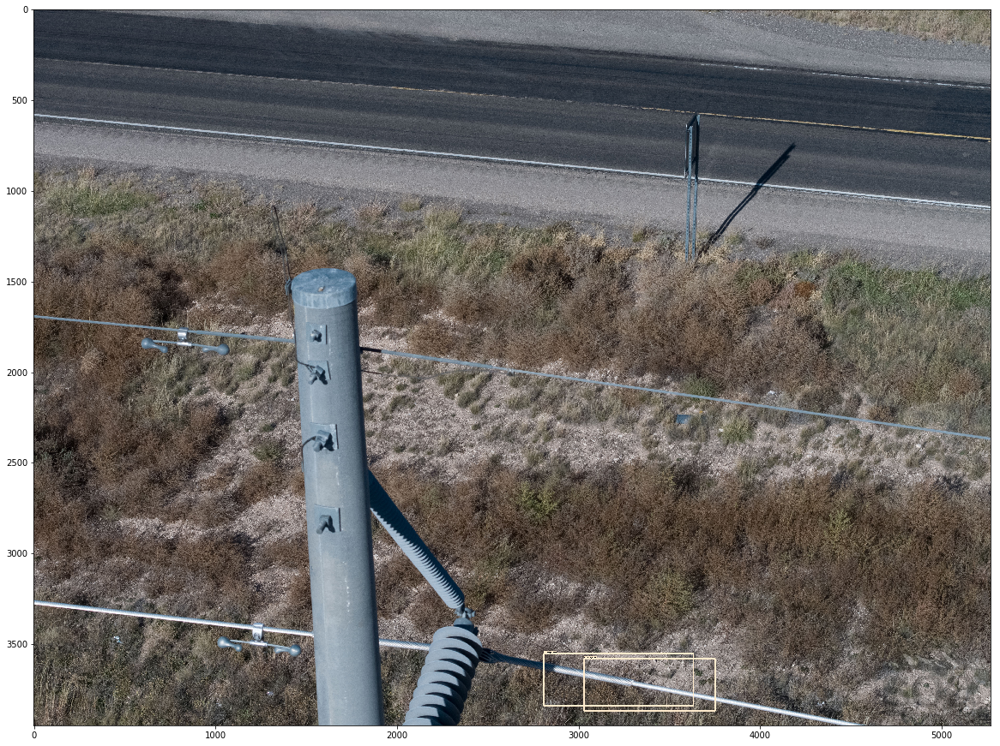

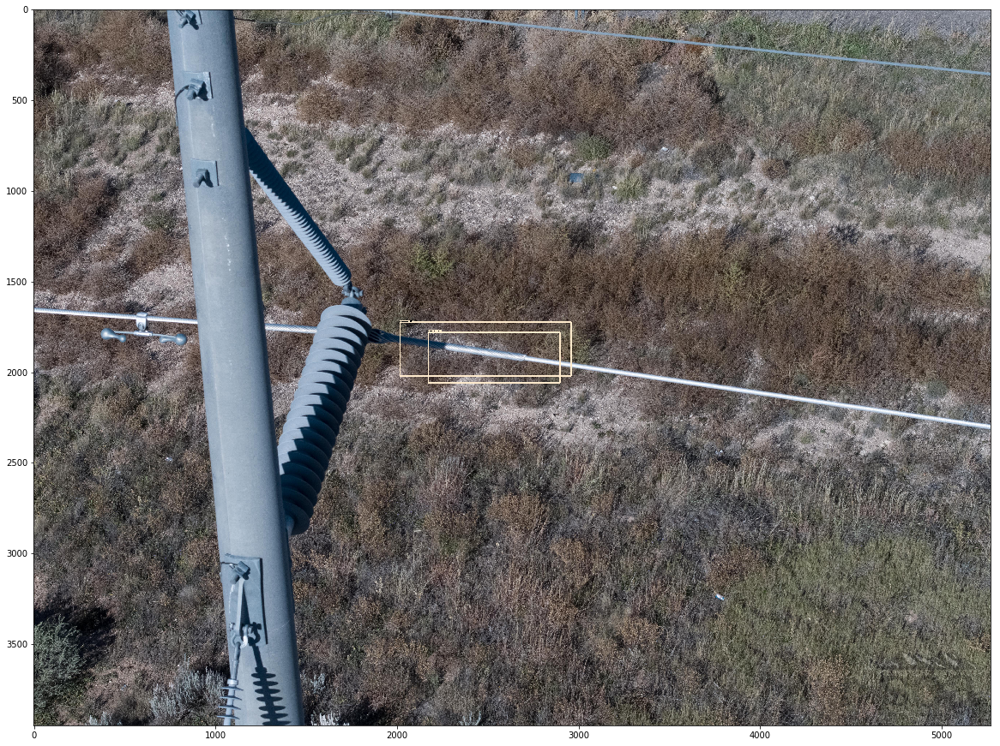

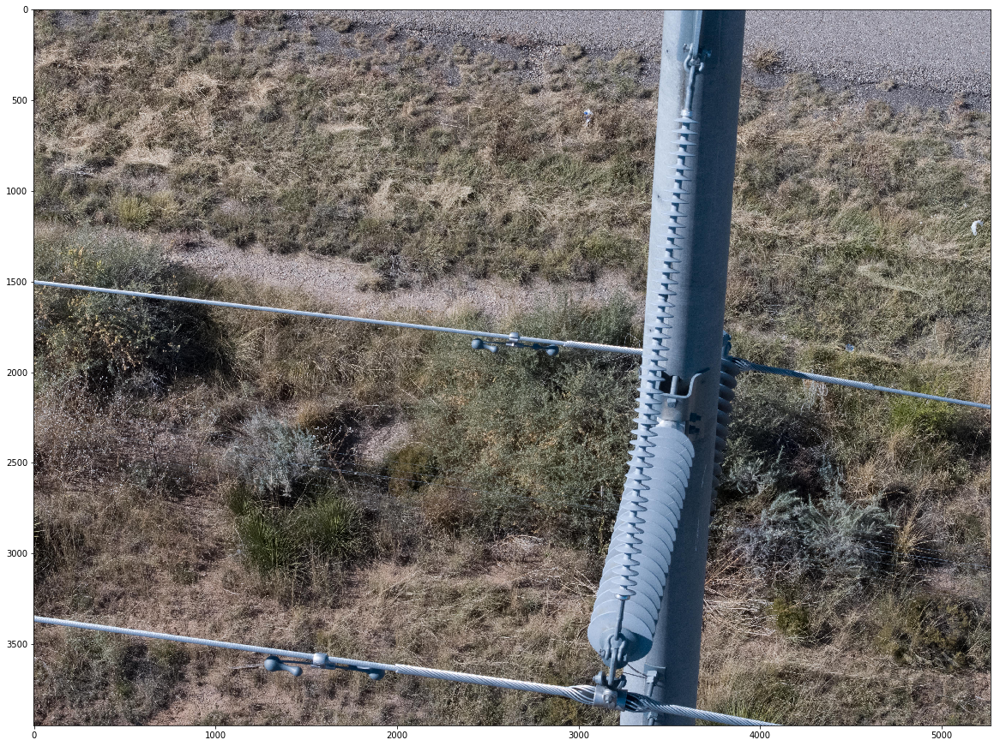

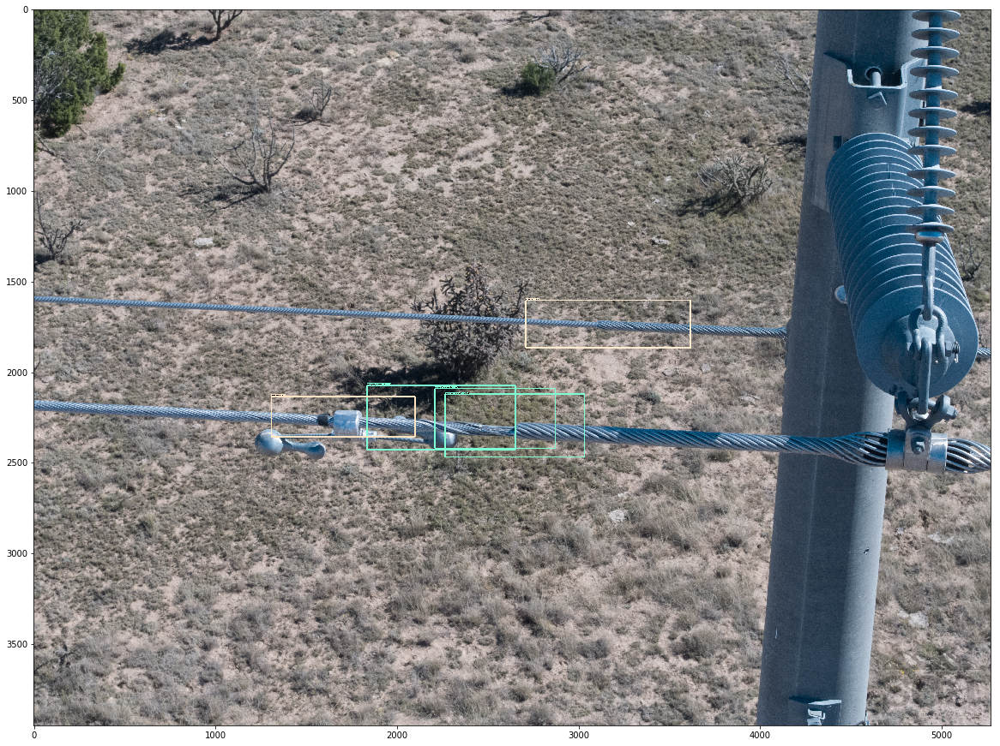

In [17]:
from object_detection.utils import label_map_util

from object_detection.utils import visualization_utils as vis_util
for image_path in TEST_IMAGE_PATHS:
  image = Image.open(image_path)
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = load_image_into_numpy_array(image)
  # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
#   image_np_expanded = np.expand_dims(image_np, axis=0)
  # Actual detection.
  output_dict = run_inference_for_single_image(image_np, detection_graph)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8,min_score_thresh=.4)
  plt.figure(figsize=IMAGE_SIZE)
  plt.imshow(image_np)